In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
 import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.applications import ResNet50, InceptionV3
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import to_categorical
from sklearn.utils import class_weight
from keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score
import numpy as np
from PIL import Image
from keras.preprocessing.image import img_to_array, load_img
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import sobel
from skimage.filters import scharr

In [7]:
data_dir = 'D:/archive/BananaLSD/AugmentedSet'
datagen = ImageDataGenerator(validation_split=0.2, rescale=1./255)
train_generator = datagen.flow_from_directory(data_dir, target_size=(128, 128), batch_size=32, class_mode='categorical', subset='training')
val_generator = datagen.flow_from_directory(data_dir, target_size=(128, 128), batch_size=32, class_mode='categorical', subset='validation')

Found 1280 images belonging to 4 classes.
Found 320 images belonging to 4 classes.


Data Augmentation

In [75]:
pip install opencv-python

   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
    --------------------------------------- 0.5/38.8 MB 4.2 MB/s eta 0:00:10
   - -------------------------------------- 1.6/38.8 MB 3.8 MB/s eta 0:00:10
   -- ------------------------------------- 2.4/38.8 MB 3.8 MB/s eta 0:00:10
   --- ------------------------------------ 3.1/38.8 MB 3.9 MB/s eta 0:00:10
   ---- ----------------------------------- 4.2/38.8 MB 3.9 MB/s eta 0:00:09
   ----- ---------------------------------- 5.0/38.8 MB 4.0 MB/s eta 0:00:09
   ----- ---------------------------------- 5.8/38.8 MB 4.0 MB/s eta 0:00:09
   ------- -------------------------------- 6.8/38.8 MB 4.0 MB/s eta 0:00:09
   ------- -------------------------------- 7.6/38.8 MB 4.1 MB/s eta 0:00:08
   -------- ------------------------------- 8.7/38.8 MB 4.0 MB/s eta 0:00:08
   --------- ------------------------------ 9.4/38.8 MB 4.1 MB/s eta 0:00:08
   ---------- ----------------------------- 10.2/38.8 MB 4.1 MB/s eta 0:00:08
   --

Found 937 images belonging to 4 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04489102..1.110787].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.53757024..1.3072714].


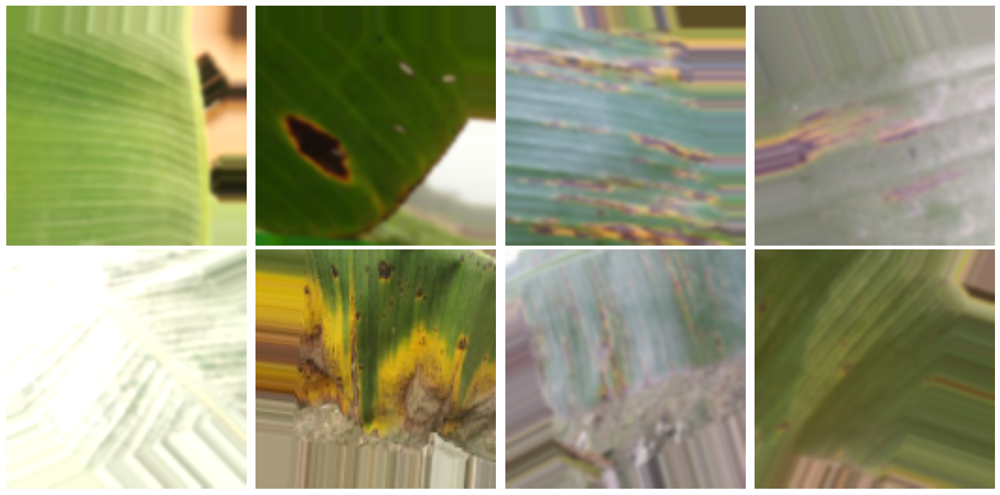

In [83]:

import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from imgaug import augmenters as iaa

# Function for custom augmentation (Gaussian blur, Linear contrast, etc.)
def custom_augment(image):
    # Convert to numpy array
    image = np.array(image)
    
    # Gaussian Blur
    if np.random.rand() > 0.5:  # Apply with 50% probability
        image = cv2.GaussianBlur(image, (5, 5), 0)
    
    # Linear Contrast
    if np.random.rand() > 0.5:  # Apply with 50% probability
        contrast = iaa.LinearContrast((0.75, 1.5))  # Random contrast adjustment
        image = contrast.augment_image(image)

    return image

# Define the ImageDataGenerator with standard augmentations
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,      # Random rotations
    width_shift_range=0.2,  # Horizontal shifts
    height_shift_range=0.2,  # Vertical shifts
    shear_range=20,         # Shear transformation
    zoom_range=0.2,         # Random zoom
    horizontal_flip=True,   # Horizontal flip
    fill_mode='nearest'     # Filling strategy for new pixels
)

# Example: Custom augmentation for one batch
def augment_and_display(data_dir):
    # Load and augment images
    generator = datagen.flow_from_directory(
        data_dir,
        target_size=(128, 128),  # Resize images
        batch_size=8,           # Generate 8 images for visualization
        class_mode=None         # Ignore labels for this example
    )
    
    images = next(generator)
    augmented_images = [custom_augment(img) for img in images]
    
    # Plot original and augmented images
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()
    for img, ax in zip(augmented_images, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Replace 'data_dir' with the path to your dataset
augment_and_display("D:/archive/BananaLSD/OriginalSet")


Found 1600 images belonging to 4 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.09749154..1.2519666].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.011587954..1.2237947].


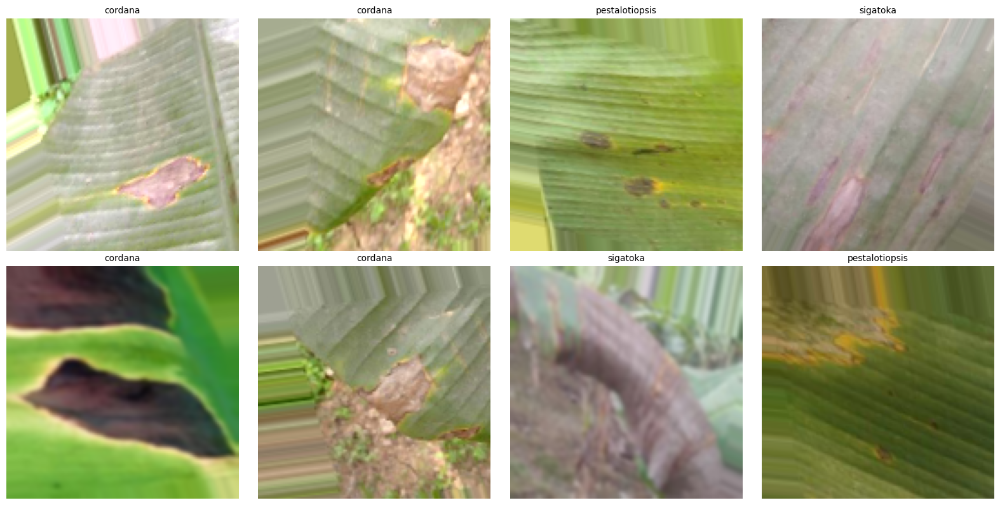

In [85]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from imgaug import augmenters as iaa

# Function for custom augmentation (Gaussian blur, Linear contrast, etc.)
def custom_augment(image):
    # Convert to numpy array
    image = np.array(image)
    
    # Gaussian Blur
    if np.random.rand() > 0.5:  # Apply with 50% probability
        image = cv2.GaussianBlur(image, (5, 5), 0)
    
    # Linear Contrast
    if np.random.rand() > 0.5:  # Apply with 50% probability
        contrast = iaa.LinearContrast((0.75, 1.5))  # Random contrast adjustment
        image = contrast.augment_image(image)

    return image

# Define the ImageDataGenerator with standard augmentations
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,      # Random rotations
    width_shift_range=0.2,  # Horizontal shifts
    height_shift_range=0.2,  # Vertical shifts
    shear_range=20,         # Shear transformation
    zoom_range=0.2,         # Random zoom
    horizontal_flip=True,   # Horizontal flip
    fill_mode='nearest'     # Filling strategy for new pixels
)

# Example: Custom augmentation for one batch
def augment_and_display(data_dir):
    # Load and augment images
    generator = datagen.flow_from_directory(
        data_dir,
        target_size=(128, 128),  # Resize images
        batch_size=8,           # Generate 8 images for visualization
        class_mode='categorical'  # Include labels
    )
    
    # Get one batch of images and labels
    images, labels = next(generator)
    augmented_images = [custom_augment(img) for img in images]
    
    # Get class labels
    class_indices = generator.class_indices
    label_map = {v: k for k, v in class_indices.items()}  # Map indices to class names
    label_names = [label_map[np.argmax(lbl)] for lbl in labels]
    
    # Plot original and augmented images with labels
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()
    for img, label, ax in zip(augmented_images, label_names, axes):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(label, fontsize=10)  # Set label as title
    plt.tight_layout()
    plt.show()

# Replace 'data_dir' with the path to your dataset
augment_and_display("D:/archive/BananaLSD/AugmentedSet")


In [79]:
pip install imgaug


   ---------------------------------------- 0.0/948.0 kB ? eta -:--:--
   ---------------------- ----------------- 524.3/948.0 kB 2.8 MB/s eta 0:00:01
   ---------------------------------------- 948.0/948.0 kB 2.9 MB/s eta 0:00:00
   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
   -------------- ------------------------- 0.5/1.4 MB 3.4 MB/s eta 0:00:01
   ------------------------------------ --- 1.3/1.4 MB 3.2 MB/s eta 0:00:01
   ---------------------------------------- 1.4/1.4 MB 3.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


Loading image from: D:/archive/BananaLSD/OriginalSet/pestalotiopsis\26.jpeg


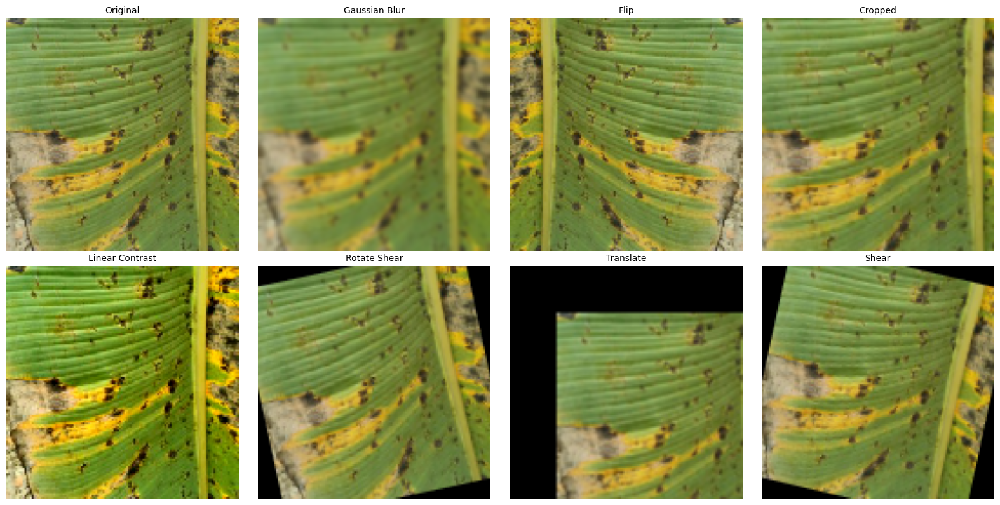

In [108]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import cv2
from imgaug import augmenters as iaa
import os

# Define custom augmentations
def augmentations_pipeline(image):
    augmented_images = {}

    # 1. Original Image
    augmented_images["Original"] = image

    # 2. Gaussian Blur
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    augmented_images["Gaussian Blur"] = blurred

    # 3. Flip (Horizontal Flip)
    flipped = cv2.flip(image, 1)
    augmented_images["Flip"] = flipped

    # 4. Cropped (Center Crop)
    height, width = image.shape[:2]
    cropped = image[int(0.1 * height):int(0.9 * height), int(0.1 * width):int(0.9 * width)]
    cropped = cv2.resize(cropped, (width, height))  # Resize back to original size
    augmented_images["Cropped"] = cropped

    # 5. Linear Contrast
    contrast = iaa.LinearContrast((1.5))  # Increase contrast
    contrasted = contrast.augment_image(image)
    augmented_images["Linear Contrast"] = contrasted

    # 6. Rotate Shear
    rotate_shear = iaa.Affine(rotate=(-25, 25), shear=(-15, 15))
    rotated_sheared = rotate_shear.augment_image(image)
    augmented_images["Rotate Shear"] = rotated_sheared

    # 7. Translate
    translate = iaa.Affine(translate_percent={"x": 0.2, "y": 0.2})
    translated = translate.augment_image(image)
    augmented_images["Translate"] = translated

    # 8. Shear
    shear = iaa.Affine(shear=(-20, 20))
    sheared = shear.augment_image(image)
    augmented_images["Shear"] = sheared

    return augmented_images

# Display the augmentations
def display_augmentations(data_dir, image_filename):
    # Load the original image
    image_path = os.path.join(data_dir, image_filename)  # Correctly join the path
    print(f"Loading image from: {image_path}")  # Debugging line to verify the path
    
    try:
        original_image = load_img(image_path, target_size=(128, 128))
        original_image = img_to_array(original_image).astype(np.uint8)
    except Exception as e:
        print(f"Error loading image: {e}")
        return

    # Apply augmentations
    augmented_images = augmentations_pipeline(original_image)

    # Plot augmented images
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()
    for ax, (aug_name, aug_image) in zip(axes, augmented_images.items()):
        ax.imshow(aug_image)
        ax.axis('off')
        ax.set_title(aug_name, fontsize=10)
    plt.tight_layout()
    plt.show()

# Replace 'data_dir' with your dataset directory and provide a sample image name
display_augmentations("D:/archive/BananaLSD/OriginalSet/pestalotiopsis", "26.jpeg")  # Update path with the correct filename


In [8]:
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(train_generator.classes), y=train_generator.classes)
class_weights = {i : class_weights[i] for i in range(len(class_weights))}

In [9]:
class_weights

{0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0}

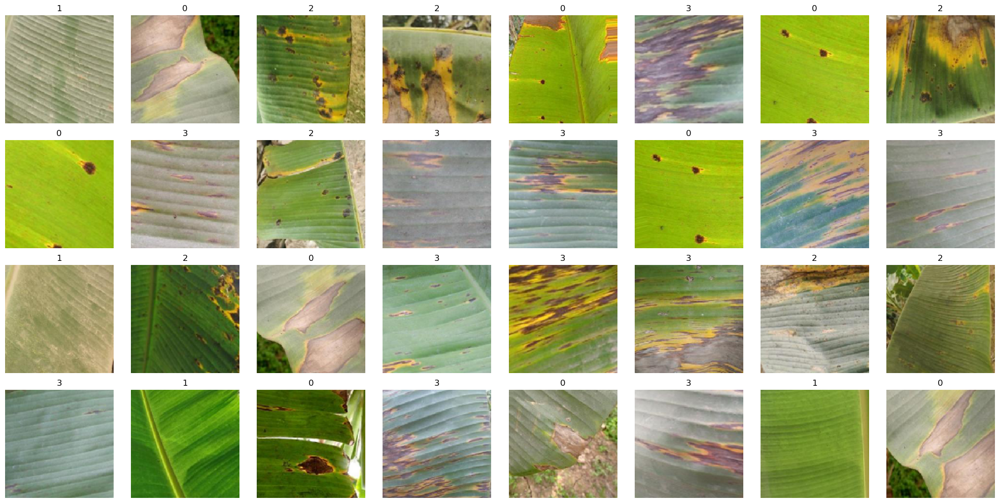

In [10]:
images, labels = next(train_generator)

def plot_images(images_arr, labels_arr):
    fig, axes = plt.subplots(4, 8, figsize=(20, 10))
    axes = axes.flatten()
    for img, lbl, ax in zip(images_arr, labels_arr, axes):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(np.argmax(lbl))
    plt.tight_layout()
    plt.show()

plot_images(images, labels)

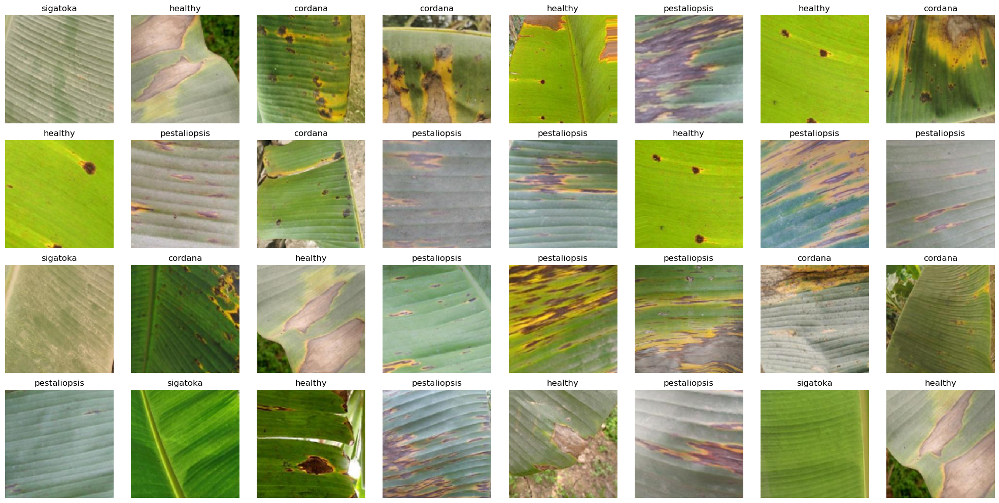

In [53]:
import numpy as np
import matplotlib.pyplot as plt

# Define label mapping
label_mapping = {0: "healthy", 1: "sigatoka", 2: "cordana", 3: "pestaliopsis"}

def plot_images(images_arr, labels_arr):
    fig, axes = plt.subplots(4, 8, figsize=(20, 10))
    axes = axes.flatten()
    for img, lbl, ax in zip(images_arr, labels_arr, axes):
        ax.imshow(img)
        ax.axis('off')
        # Get the label name using the mapping dictionary
        ax.set_title(label_mapping[np.argmax(lbl)])
    plt.tight_layout()
    plt.show()

# Call the function
plot_images(images, labels)


In [11]:
def apply_sobel(images_arr):
    sobel_images = []
    for img in images_arr:
        gray_img = np.dot(img[...,:3], [0.2989, 0.5870, 0.1140])
        sobel_x = sobel(gray_img, axis=0, mode='constant')
        sobel_y = sobel(gray_img, axis=1, mode='constant')
        sobel_img = np.hypot(sobel_x, sobel_y)
        sobel_images.append(sobel_img)
    return np.array(sobel_images)

sobel_images = apply_sobel(images)

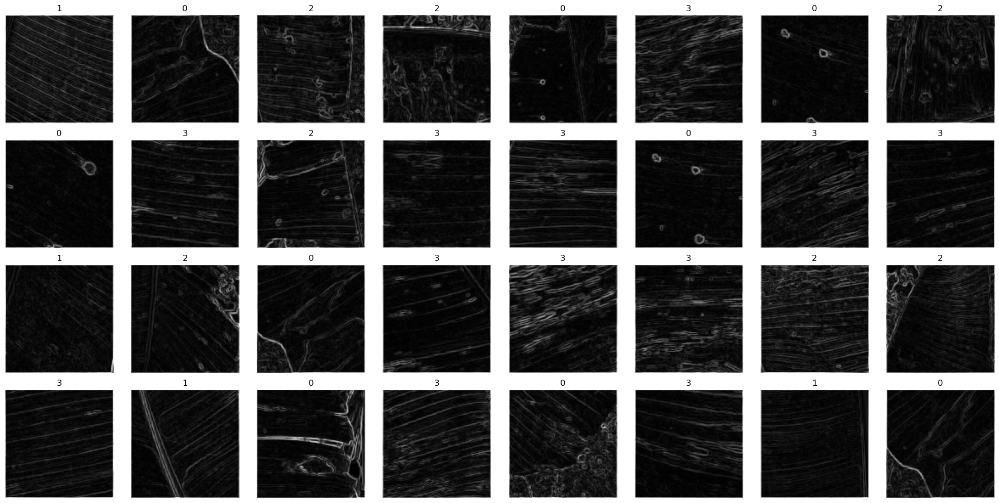

In [12]:
def plot_sobel_images(original_images, sobel_images, labels_arr):
    fig, axes = plt.subplots(4, 8, figsize=(20, 10))
    axes = axes.flatten()
    for orig_img, sob_img, lbl, ax in zip(original_images, sobel_images, labels_arr, axes):
        ax.imshow(sob_img, cmap='gray')
        ax.axis('off')
        ax.set_title(np.argmax(lbl))
    plt.tight_layout()
    plt.show()

plot_sobel_images(images, sobel_images, labels)

In [13]:
type(train_generator)

keras.src.legacy.preprocessing.image.DirectoryIterator

Improved SqueezeNet

In [15]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam

# Load the pretrained EfficientNetB0 model without the top (output) layer
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze the base model layers (optional, for transfer learning)
base_model.trainable = False

# Add custom layers on top of the base model
model_efficientnet = Sequential([
    base_model,  # Base EfficientNetB0 model
    GlobalAveragePooling2D(),  # Reduce spatial dimensions
    BatchNormalization(),
    Dense(256, activation='relu'),  # Fully connected layer
    Dropout(0.5),
    Dense(128, activation='relu'),  # Fully connected layer
    Dropout(0.5),
    Dense(4, activation='softmax')  # Final output layer for 4 classes
])

# Compile the model
model_efficientnet.compile(
    optimizer=Adam(learning_rate=1e-3),  # Use Adam optimizer
    loss='categorical_crossentropy',    # Use categorical cross-entropy loss
    metrics=['accuracy']                # Track accuracy during training
)

# Train the model
history_efficientnet = model_efficientnet.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)


Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 606ms/step - accuracy: 0.2586 - loss: 1.8409 - val_accuracy: 0.2500 - val_loss: 1.3868
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 22s 543ms/step - accuracy: 0.2333 - loss: 1.7172 - val_accuracy: 0.2500 - val_loss: 1.3865
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 535ms/step - accuracy: 0.2334 - loss: 1.5480 - val_accuracy: 0.2500 - val_loss: 1.3866
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 529ms/step - accuracy: 0.2467 - loss: 1.5260 - val_accuracy: 0.2500 - val_loss: 1.3865
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 529ms/step - accuracy: 0.2300 - loss: 1.4640 - val_accuracy: 0.3438 - val_loss: 1.3864
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 524ms/step - accuracy: 0.2240 - loss: 1.4430 - val_accuracy: 0.2812 - val_loss: 1.3863
Epoch 7/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 22s 544ms/step - accuracy: 0.2382 - loss: 1.4373 - val_accuracy: 0.2500 - val_loss: 1.3864
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 22s 542ms/step - accuracy: 0.2527 - loss: 1.4195 - val_accu

In [16]:
base_model.trainable = True
model_efficientnet.compile(
    optimizer=Adam(learning_rate=1e-4),  # Lower learning rate for fine-tuning
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


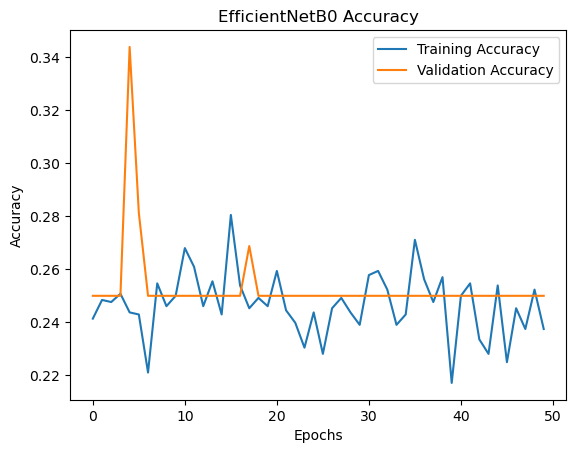

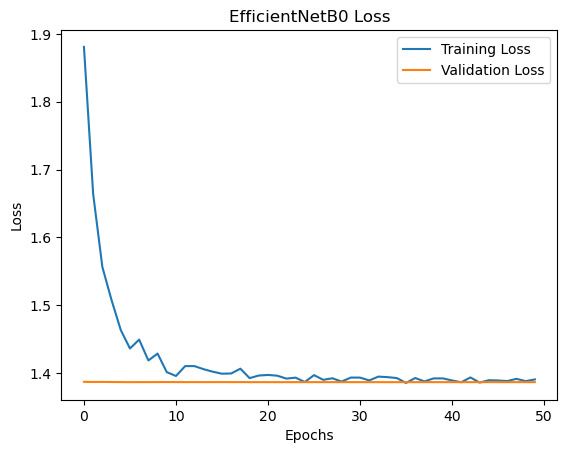

In [17]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history_efficientnet.history['accuracy'], label='Training Accuracy')
plt.plot(history_efficientnet.history['val_accuracy'], label='Validation Accuracy')
plt.title('SqueezeNet Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Plot training and validation loss
plt.plot(history_efficientnet.history['loss'], label='Training Loss')
plt.plot(history_efficientnet.history['val_loss'], label='Validation Loss')
plt.title('SqueezeNet Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


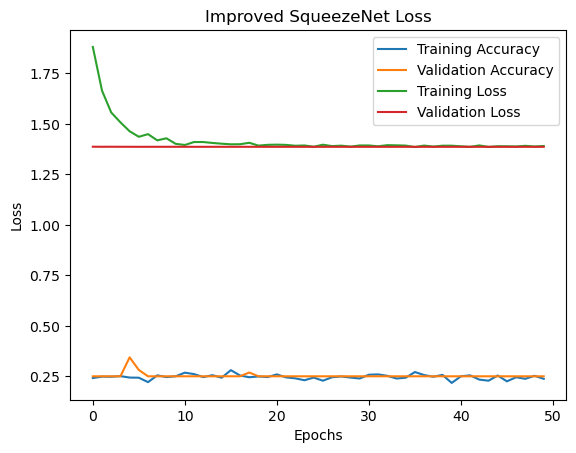

In [18]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history_efficientnet.history['accuracy'], label='Training Accuracy')
plt.plot(history_efficientnet.history['val_accuracy'], label='Validation Accuracy')
plt.title('Improved SqueezeNet Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')


# Plot training and validation loss
plt.plot(history_efficientnet.history['loss'], label='Training Loss')
plt.plot(history_efficientnet.history['val_loss'], label='Validation Loss')
plt.title('Improved SqueezeNet Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


MobileNetV3

In [20]:
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

# Load the pretrained MobileNetV3Large model without the top (output) layer
base_model = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze the base model layers
base_model.trainable = False

# Add custom layers
model_mobilenetv3 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    BatchNormalization(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(4, activation='softmax')  # Output for 4 classes
])

# Compile the model
model_mobilenetv3.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history_mobilenetv3 = model_mobilenetv3.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)


Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 26s 357ms/step - accuracy: 0.3902 - loss: 1.2905 - val_accuracy: 0.2500 - val_loss: 1.8970
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 12s 288ms/step - accuracy: 0.5466 - loss: 1.0632 - val_accuracy: 0.2500 - val_loss: 1.9404
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 283ms/step - accuracy: 0.6053 - loss: 0.9591 - val_accuracy: 0.2531 - val_loss: 1.8726
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 283ms/step - accuracy: 0.6500 - loss: 0.9177 - val_accuracy: 0.2625 - val_loss: 1.6648
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 12s 287ms/step - accuracy: 0.7007 - loss: 0.8275 - val_accuracy: 0.2812 - val_loss: 1.5760
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 280ms/step - accuracy: 0.6746 - loss: 0.8078 - val_accuracy: 0.2875 - val_loss: 1.4394
Epoch 7/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 12s 288ms/step - accuracy: 0.7134 - loss: 0.7460 - val_accuracy: 0.3625 - val_loss: 1.3657
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 276ms/step - accuracy: 0.6957 - loss: 0.7796 - val_accu

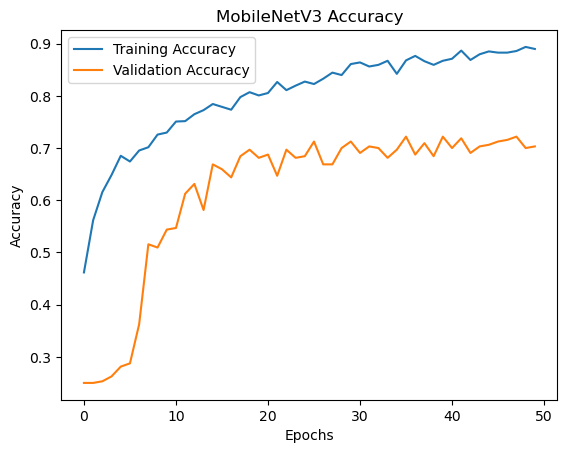

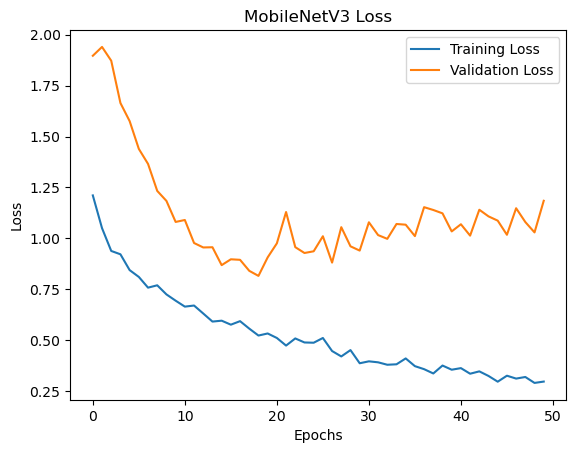

In [21]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history_mobilenetv3.history['accuracy'], label='Training Accuracy')
plt.plot(history_mobilenetv3.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV3 Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history_mobilenetv3.history['loss'], label='Training Loss')
plt.plot(history_mobilenetv3.history['val_loss'], label='Validation Loss')
plt.title('MobileNetV3 Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


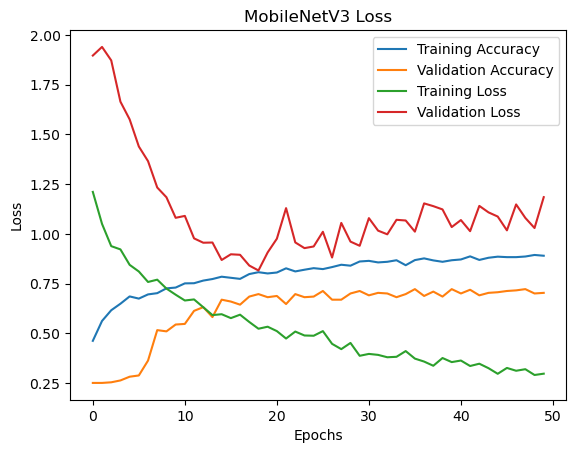

In [22]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history_mobilenetv3.history['accuracy'], label='Training Accuracy')
plt.plot(history_mobilenetv3.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV3 Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')


# Plot training and validation loss
plt.plot(history_mobilenetv3.history['loss'], label='Training Loss')
plt.plot(history_mobilenetv3.history['val_loss'], label='Validation Loss')
plt.title('MobileNetV3 Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


ResNet101

In [24]:
from tensorflow.keras.applications import ResNet101

# Load the pretrained ResNet101 model without the top (output) layer
base_model = ResNet101(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze the base model layers
base_model.trainable = False

# Add custom layers
model_resnet101 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    BatchNormalization(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(4, activation='softmax')  # Output for 4 classes
])

# Compile the model
model_resnet101.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history_resnet101 = model_resnet101.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)


Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 146s 3s/step - accuracy: 0.4246 - loss: 1.2522 - val_accuracy: 0.3469 - val_loss: 1.5750
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 118s 3s/step - accuracy: 0.5896 - loss: 1.0280 - val_accuracy: 0.3438 - val_loss: 1.4877
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 122s 3s/step - accuracy: 0.5929 - loss: 0.9766 - val_accuracy: 0.2719 - val_loss: 1.5620
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 114s 3s/step - accuracy: 0.6480 - loss: 0.9029 - val_accuracy: 0.3562 - val_loss: 1.4641
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 121s 3s/step - accuracy: 0.6728 - loss: 0.8300 - val_accuracy: 0.3562 - val_loss: 1.3870
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 121s 3s/step - accuracy: 0.6692 - loss: 0.8453 - val_accuracy: 0.3719 - val_loss: 1.3449
Epoch 7/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 120s 3s/step - accuracy: 0.7366 - loss: 0.7253 - val_accuracy: 0.4156 - val_loss: 1.1481
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 116s 3s/step - accuracy: 0.7184 - loss: 0.7440 - val_accuracy: 0.4563 - v

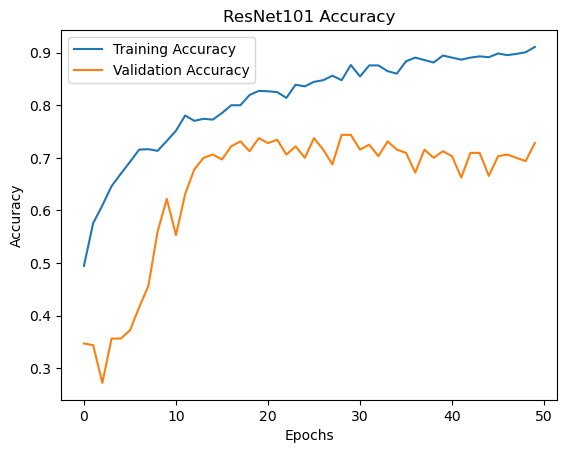

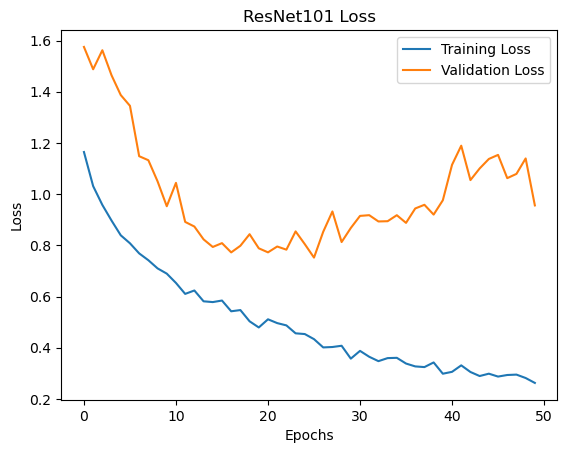

In [25]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history_resnet101.history['accuracy'], label='Training Accuracy')
plt.plot(history_resnet101.history['val_accuracy'], label='Validation Accuracy')
plt.title('ResNet101 Accuracy') 
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation   loss
plt.plot(history_resnet101.history['loss'], label='Training Loss')
plt.plot(history_resnet101.history['val_loss'], label='Validation Loss')
plt.title('ResNet101 Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


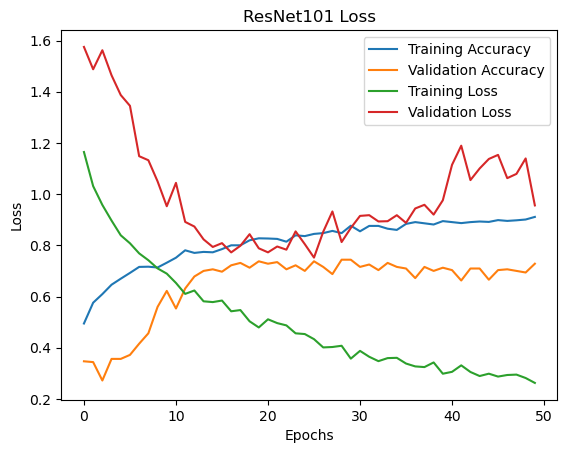

In [26]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history_resnet101.history['accuracy'], label='Training Accuracy')
plt.plot(history_resnet101.history['val_accuracy'], label='Validation Accuracy')
plt.title('ResNet101 Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Plot training and validation loss
plt.plot(history_resnet101.history['loss'], label='Training Loss')
plt.plot(history_resnet101.history['val_loss'], label='Validation Loss')
plt.title('ResNet101 Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


ResNet50

In [28]:
from tensorflow.keras.applications import ResNet50

# Load the pretrained ResNet50 model without the top (output) layer
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze the base model layers
base_model.trainable = False

# Add custom layers
model_resnet50 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    BatchNormalization(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(4, activation='softmax')  # Output for 4 classes
])

# Compile the model
model_resnet50.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history_resnet50 = model_resnet50.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)


Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - accuracy: 0.4048 - loss: 1.2936 - val_accuracy: 0.2500 - val_loss: 1.8716
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step - accuracy: 0.5461 - loss: 1.0527 - val_accuracy: 0.3844 - val_loss: 1.8920
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - accuracy: 0.6323 - loss: 0.9212 - val_accuracy: 0.2562 - val_loss: 2.0316
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - accuracy: 0.6619 - loss: 0.8176 - val_accuracy: 0.2719 - val_loss: 1.8995
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - accuracy: 0.6841 - loss: 0.7972 - val_accuracy: 0.2625 - val_loss: 2.0382
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.7285 - loss: 0.7090 - val_accuracy: 0.2812 - val_loss: 1.8788
Epoch 7/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.7464 - loss: 0.6643 - val_accuracy: 0.2906 - val_loss: 1.8603
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - accuracy: 0.7559 - loss: 0.6430 - val_accuracy: 0.4281 - val_loss:

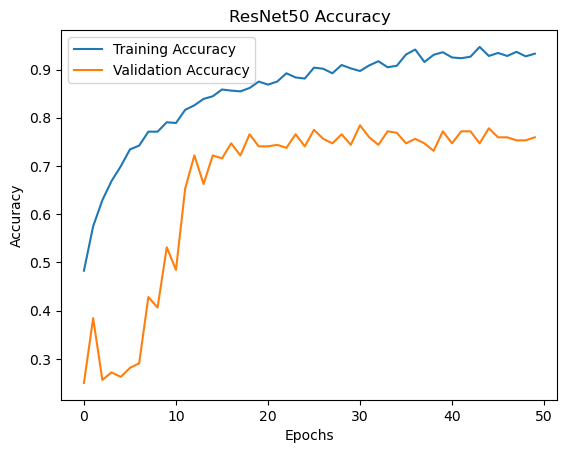

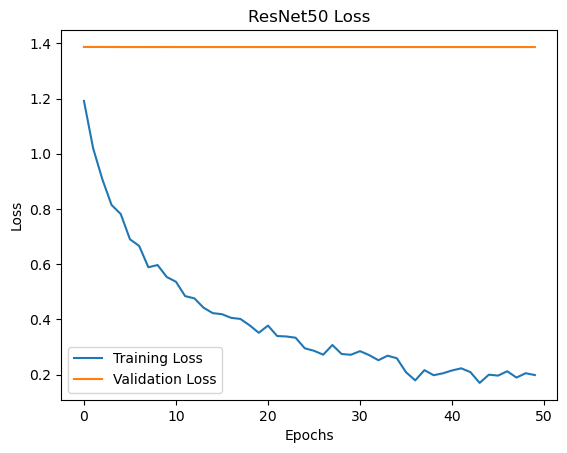

In [29]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history_resnet50.history['accuracy'], label='Training Accuracy')
plt.plot(history_resnet50.history['val_accuracy'], label='Validation Accuracy')
plt.title('ResNet50 Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history_resnet50.history['loss'], label='Training Loss')
plt.plot(history_efficientnet.history['val_loss'], label='Validation Loss')
plt.title('ResNet50 Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


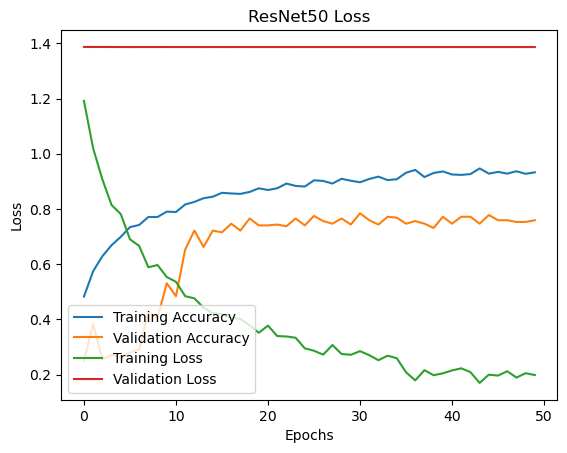

In [30]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history_resnet50.history['accuracy'], label='Training Accuracy')
plt.plot(history_resnet50.history['val_accuracy'], label='Validation Accuracy')
plt.title('ResNet50 Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')


# Plot training and validation loss
plt.plot(history_resnet50.history['loss'], label='Training Loss')
plt.plot(history_efficientnet.history['val_loss'], label='Validation Loss')
plt.title('ResNet50 Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show() 


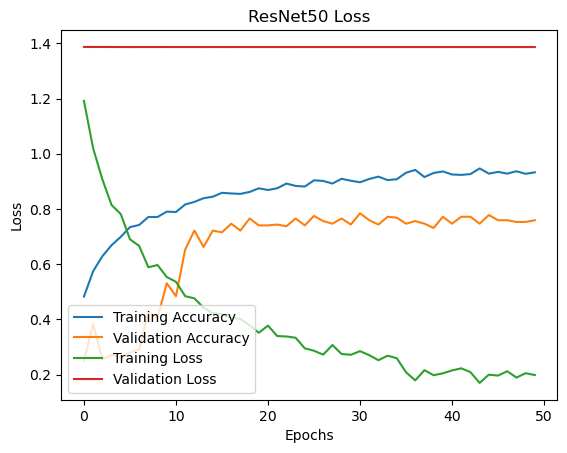

In [31]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history_resnet50.history['accuracy'], label='Training Accuracy')
plt.plot(history_resnet50.history['val_accuracy'], label='Validation Accuracy')
plt.title('ResNet50 Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')


# Plot training and validation loss
plt.plot(history_resnet50.history['loss'], label='Training Loss')
plt.plot(history_efficientnet.history['val_loss'], label='Validation Loss')
plt.title('ResNet50 Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [32]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, GlobalAveragePooling2D, Activation
from tensorflow.keras.layers import concatenate
from tensorflow.keras.optimizers import Adam

def fire_module(x, squeeze_filters, expand_filters):
    """
    Implements a Fire module for SqueezeNet.
    
    Args:
        x: Input tensor.
        squeeze_filters: Number of filters in the squeeze layer.
        expand_filters: Number of filters in the expand layer.
        
    Returns:
        Output tensor of the Fire module.
    """
    # Squeeze layer
    squeeze = Conv2D(squeeze_filters, (1, 1), activation='relu', padding='same')(x)
    
    # Expand layer (1x1 and 3x3 convolutions)
    expand1x1 = Conv2D(expand_filters, (1, 1), activation='relu', padding='same')(squeeze)
    expand3x3 = Conv2D(expand_filters, (3, 3), activation='relu', padding='same')(squeeze)
    
    # Concatenate expand layers
    output = concatenate([expand1x1, expand3x3])
    return output

def build_squeezenet(input_shape=(128, 128, 3), num_classes=4):
    """
    Builds the SqueezeNet model.
    
    Args:
        input_shape: Shape of the input images (H, W, C).
        num_classes: Number of output classes.
        
    Returns:
        A Keras Model instance.
    """
    inputs = Input(shape=input_shape)
    
    # Initial Conv Layer
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    
    # Fire modules
    x = fire_module(x, squeeze_filters=16, expand_filters=64)
    x = fire_module(x, squeeze_filters=16, expand_filters=64)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    
    x = fire_module(x, squeeze_filters=32, expand_filters=128)
    x = fire_module(x, squeeze_filters=32, expand_filters=128)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    
    x = fire_module(x, squeeze_filters=48, expand_filters=192)
    x = fire_module(x, squeeze_filters=48, expand_filters=192)
    x = fire_module(x, squeeze_filters=64, expand_filters=256)
    x = fire_module(x, squeeze_filters=64, expand_filters=256)
    
    # Final layers
    x = Dropout(0.5)(x)
    x = Conv2D(num_classes, (1, 1), activation='relu', padding='same')(x)
    x = GlobalAveragePooling2D()(x)
    outputs = Activation('softmax')(x)
    
    # Create model
    model = Model(inputs, outputs, name="SqueezeNet")
    return model

# Build and compile the model
model_squeezenet = build_squeezenet(input_shape=(128, 128, 3), num_classes=4)
model_squeezenet.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history_squeezenet = model_squeezenet.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - accuracy: 0.2553 - loss: 1.3866 - val_accuracy: 0.2500 - val_loss: 1.3863
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.2268 - loss: 1.3863 - val_accuracy: 0.2500 - val_loss: 1.3863
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.2654 - loss: 1.3863 - val_accuracy: 0.2500 - val_loss: 1.3863
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.2629 - loss: 1.3863 - val_accuracy: 0.2500 - val_loss: 1.3863
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.2744 - loss: 1.3863 - val_accuracy: 0.2500 - val_loss: 1.3863
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.2648 - loss: 1.3863 - val_accuracy: 0.2500 - val_loss: 1.3863
Epoch 7/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.2448 - loss: 1.3863 - val_accuracy: 0.2500 - val_loss: 1.3863
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.2549 - loss: 1.3863 - val_accuracy: 0.2500 - val_loss:

SqueezeNet

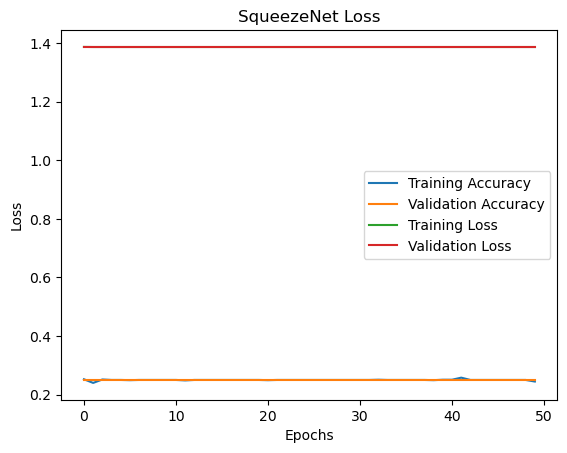

In [34]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history_squeezenet.history['accuracy'], label='Training Accuracy')
plt.plot(history_squeezenet.history['val_accuracy'], label='Validation Accuracy')
plt.title('SqueezeNet Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Plot training and validation loss
plt.plot(history_squeezenet.history['loss'], label='Training Loss')
plt.plot(history_squeezenet.history['val_loss'], label='Validation Loss')
plt.title('SqueezeNet Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show() 



In [35]:
def evaluate_model(model, generator):
    y_true = generator.classes
    y_pred = model.predict(generator)
    y_pred_classes = np.argmax(y_pred, axis=1)

    cm = confusion_matrix(y_true, y_pred_classes)
    cr = classification_report(y_true, y_pred_classes, target_names=generator.class_indices.keys())

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=generator.class_indices.keys(), yticklabels=generator.class_indices.keys())
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    print('Classification Report:')
    print(cr)

10/10 ━━━━━━━━━━━━━━━━━━━━ 8s 436ms/step


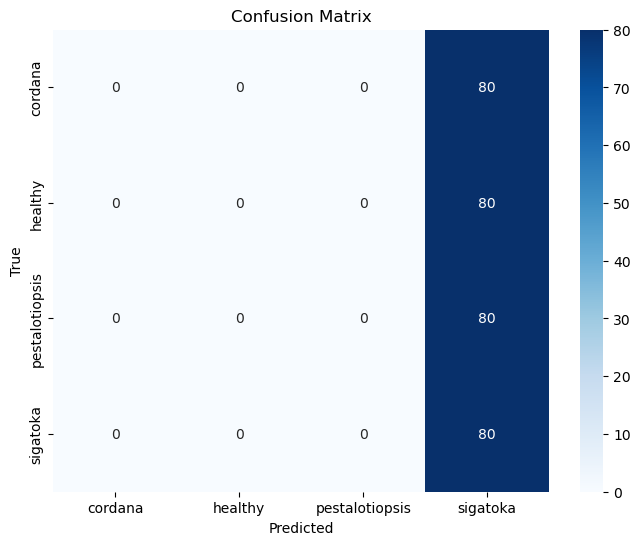

Classification Report:
                precision    recall  f1-score   support

       cordana       0.00      0.00      0.00        80
       healthy       0.00      0.00      0.00        80
pestalotiopsis       0.00      0.00      0.00        80
      sigatoka       0.25      1.00      0.40        80

      accuracy                           0.25       320
     macro avg       0.06      0.25      0.10       320
  weighted avg       0.06      0.25      0.10       320



In [36]:
evaluate_model(model_efficientnet, val_generator)

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 243ms/step


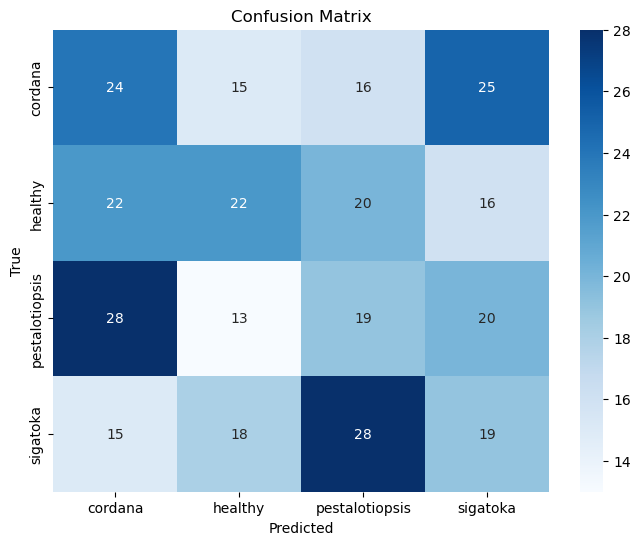

Classification Report:
                precision    recall  f1-score   support

       cordana       0.27      0.30      0.28        80
       healthy       0.32      0.28      0.30        80
pestalotiopsis       0.23      0.24      0.23        80
      sigatoka       0.24      0.24      0.24        80

      accuracy                           0.26       320
     macro avg       0.26      0.26      0.26       320
  weighted avg       0.26      0.26      0.26       320



In [37]:
evaluate_model(model_mobilenetv3, val_generator)

10/10 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step


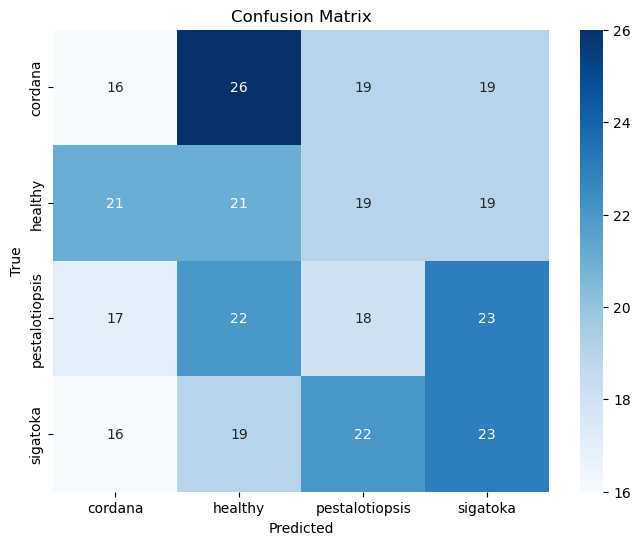

Classification Report:
                precision    recall  f1-score   support

       cordana       0.23      0.20      0.21        80
       healthy       0.24      0.26      0.25        80
pestalotiopsis       0.23      0.23      0.23        80
      sigatoka       0.27      0.29      0.28        80

      accuracy                           0.24       320
     macro avg       0.24      0.24      0.24       320
  weighted avg       0.24      0.24      0.24       320



In [38]:
evaluate_model(model_resnet101, val_generator)

10/10 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step


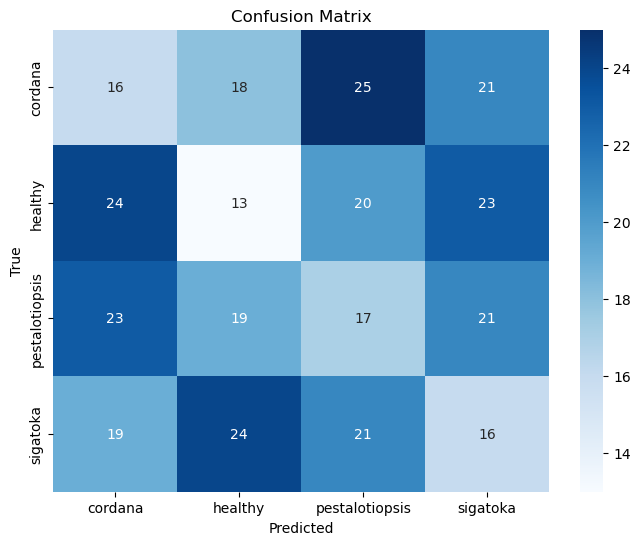

Classification Report:
                precision    recall  f1-score   support

       cordana       0.20      0.20      0.20        80
       healthy       0.18      0.16      0.17        80
pestalotiopsis       0.20      0.21      0.21        80
      sigatoka       0.20      0.20      0.20        80

      accuracy                           0.19       320
     macro avg       0.19      0.19      0.19       320
  weighted avg       0.19      0.19      0.19       320



In [39]:
 evaluate_model(model_resnet50, val_generator)

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 367ms/step


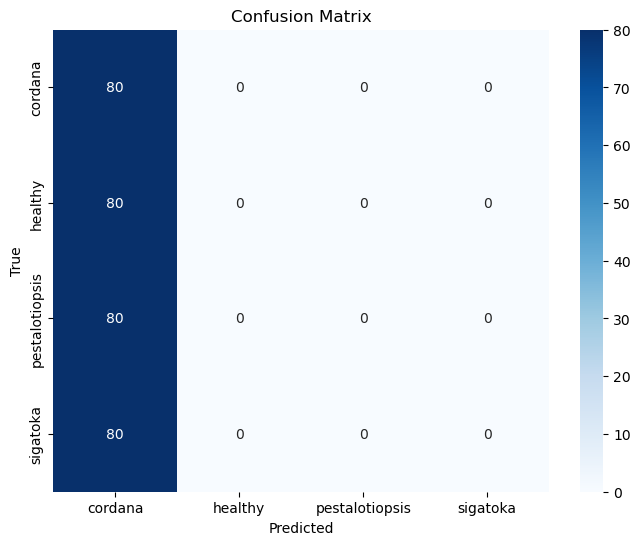

Classification Report:
                precision    recall  f1-score   support

       cordana       0.25      1.00      0.40        80
       healthy       0.00      0.00      0.00        80
pestalotiopsis       0.00      0.00      0.00        80
      sigatoka       0.00      0.00      0.00        80

      accuracy                           0.25       320
     macro avg       0.06      0.25      0.10       320
  weighted avg       0.06      0.25      0.10       320



In [40]:
 evaluate_model(model_squeezenet, val_generator)

10/10 ━━━━━━━━━━━━━━━━━━━━ 8s 685ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 376ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 33s 3s/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 512ms/step


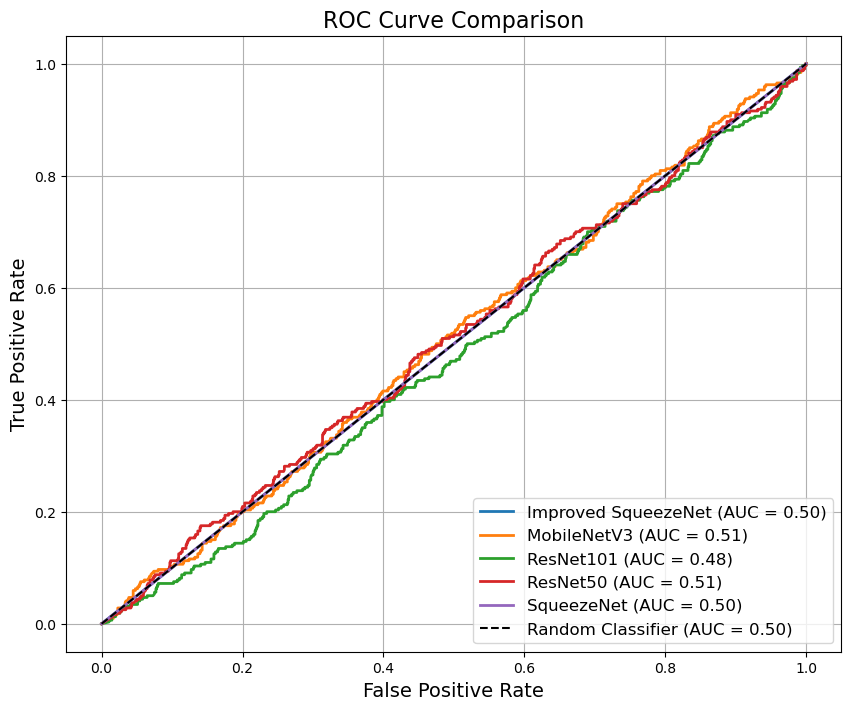

In [60]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

# Function to compute and plot ROC curve
def plot_roc_curve(models, generator, num_classes):
    """
    Plots the ROC curve for multiple models.

    Args:
        models: A dictionary of model names and trained model instances.
        generator: The test/validation generator.
        num_classes: Number of output classes.

    Returns:
        None
    """
    # Get true labels
    true_labels = generator.classes  # True labels from the generator
    class_labels = list(generator.class_indices.keys())  # Class names
    
    # One-hot encode the true labels
    from tensorflow.keras.utils import to_categorical
    true_labels_one_hot = to_categorical(true_labels, num_classes=num_classes)
    
    # Plot ROC for each model
    plt.figure(figsize=(10, 8))
    
    for model_name, model in models.items():
        # Get predicted probabilities
        predictions = model.predict(generator)
        
        # Compute ROC curve and AUC for each class
        fpr = {}
        tpr = {}
        roc_auc = {}
        
        for i in range(num_classes):
            fpr[i], tpr[i], _ = roc_curve(true_labels_one_hot[:, i], predictions[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])
        
        # Compute micro-average ROC curve and AUC
        fpr["micro"], tpr["micro"], _ = roc_curve(true_labels_one_hot.ravel(), predictions.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
        
        # Plot the micro-average ROC curve
        plt.plot(
            fpr["micro"], tpr["micro"],
            label=f'{model_name} (AUC = {roc_auc["micro"]:.2f})',
            linewidth=2
        )
    
    #Plot diagonal (random classifier)
    plt.plot([0, 1], [0, 1], 'k--', label="Random Classifier (AUC = 0.50)")
    
    # Customize plot
    plt.title("ROC Curve Comparison", fontsize=16)
    plt.xlabel("False Positive Rate", fontsize=14)
    plt.ylabel("True Positive Rate", fontsize=14)
    plt.legend(loc="lower right", fontsize=12)
    plt.grid()
    plt.show()

# Dictionary of models
models = {
    "Improved SqueezeNet": model_efficientnet,
    "MobileNetV3": model_mobilenetv3,
    "ResNet101": model_resnet101,
    "ResNet50": model_resnet50,
    "SqueezeNet": model_squeezenet,
    "
    
}

# Plot ROC curves
plot_roc_curve(models, val_generator, num_classes=4)


10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 445ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 361ms/step


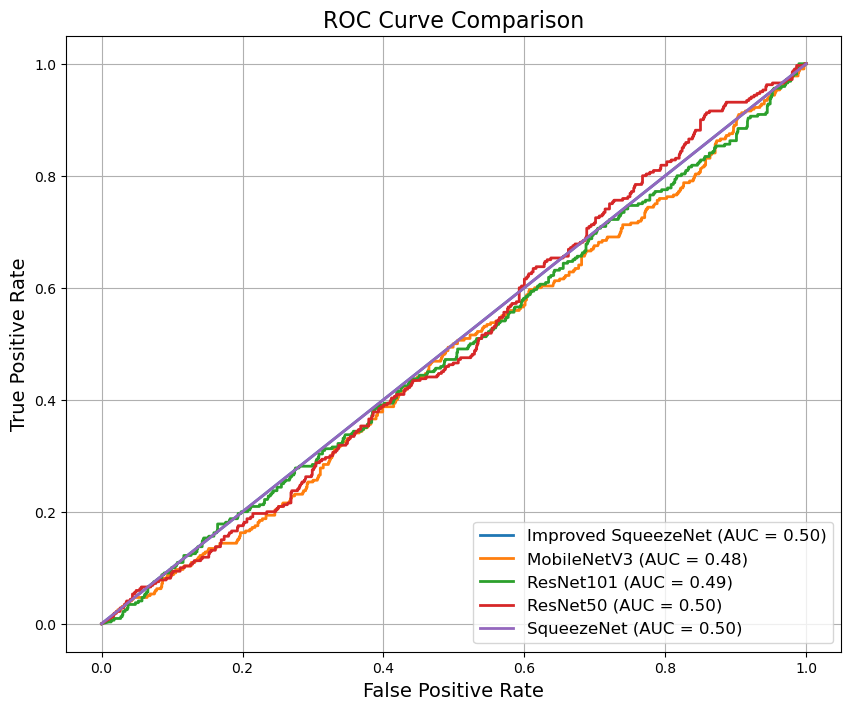

In [149]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

# Function to compute and plot ROC curve
def plot_roc_curve(models, generator, num_classes):
    """
    Plots the ROC curve for multiple models.

    Args:
        models: A dictionary of model names and trained model instances.
        generator: The test/validation generator.
        num_classes: Number of output classes.

    Returns:
        None
    """
    # Get true labels
    true_labels = generator.classes  # True labels from the generator
    class_labels = list(generator.class_indices.keys())  # Class names
    
    # One-hot encode the true labels
    from tensorflow.keras.utils import to_categorical
    true_labels_one_hot = to_categorical(true_labels, num_classes=num_classes)
    
    # Plot ROC for each model
    plt.figure(figsize=(10, 8))
    
    for model_name, model in models.items():
        # Get predicted probabilities
        predictions = model.predict(generator)
        
        # Compute ROC curve and AUC for each class
        fpr = {}
        tpr = {}
        roc_auc = {}
        
        for i in range(num_classes):
            fpr[i], tpr[i], _ = roc_curve(true_labels_one_hot[:, i], predictions[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])
        
        # Compute micro-average ROC curve and AUC
        fpr["micro"], tpr["micro"], _ = roc_curve(true_labels_one_hot.ravel(), predictions.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
        
        # Plot the micro-average ROC curve
        plt.plot(
            fpr["micro"], tpr["micro"],
            label=f'{model_name} (AUC = {roc_auc["micro"]:.2f})',
            linewidth=2
        )
    
        #Plot diagonal (random classifier)
    #plt.plot([0, 1], [0, 1], 'k--', label="Random Classifier (AUC = 0.50)")
    
    # Customize plot
    plt.title("ROC Curve Comparison", fontsize=16)
    plt.xlabel("False Positive Rate", fontsize=14)
    plt.ylabel("True Positive Rate", fontsize=14)
    plt.legend(loc="lower right", fontsize=12)
    plt.grid()
    plt.show()

# Dictionary of models
models = {
    "Improved SqueezeNet": model_efficientnet,
    "MobileNetV3": model_mobilenetv3,
    "ResNet101": model_resnet101,
    "ResNet50": model_resnet50,
    "SqueezeNet": model_squeezenet,
    
}

# Plot ROC curves
plot_roc_curve(models, val_generator, num_classes=4)


In [42]:
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

# Load the DenseNet201 model without the top layer
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze the base model layers
base_model.trainable = False

# Add custom classification layers
model_densenet201 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    BatchNormalization(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(4, activation='softmax')  # Output for 4 classes
])

# Compile the model
model_densenet201.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history_densenet201 = model_densenet201.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)


Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 147s 3s/step - accuracy: 0.5514 - loss: 1.1647 - val_accuracy: 0.7969 - val_loss: 0.5390
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 376s 10s/step - accuracy: 0.8885 - loss: 0.3094 - val_accuracy: 0.9156 - val_loss: 0.2619
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 117s 3s/step - accuracy: 0.9366 - loss: 0.1724 - val_accuracy: 0.9344 - val_loss: 0.2026
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 111s 3s/step - accuracy: 0.9662 - loss: 0.0976 - val_accuracy: 0.9500 - val_loss: 0.1598
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 110s 3s/step - accuracy: 0.9792 - loss: 0.0621 - val_accuracy: 0.9563 - val_loss: 0.1578
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 111s 3s/step - accuracy: 0.9755 - loss: 0.0677 - val_accuracy: 0.9594 - val_loss: 0.1007
Epoch 7/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 108s 3s/step - accuracy: 0.9933 - loss: 0.0330 - val_accuracy: 0.9594 - val_loss: 0.1427
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 108s 3s/step - accuracy: 0.9924 - loss: 0.0303 - val_accuracy: 0.9500 - 

DenseNet201

In [44]:
test_loss, test_acc = model_densenet201.evaluate(val_generator)
print(f"DenseNet201 Test Loss: {test_loss}, Test Accuracy: {test_acc}")


10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.9138 - loss: 0.6436
DenseNet201 Test Loss: 0.48141345381736755, Test Accuracy: 0.9281250238418579


In [45]:
test_loss, test_acc = model_densenet201.evaluate(val_generator)
print(f"DenseNet201 Test Loss: {test_loss}, Test Accuracy: {test_acc}")


10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.9494 - loss: 0.3614
DenseNet201 Test Loss: 0.48141345381736755, Test Accuracy: 0.9281250238418579


Finetuning DenseNetModel

In [47]:
# Unfreeze the base model layers
base_model.trainable = True

# Compile the model with a lower learning rate for fine-tuning
model_densenet201.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model further
history_finetune_densenet201 = model_densenet201.fit(
    train_generator,
    epochs=20,  # Use fewer epochs for fine-tuning
    validation_data=val_generator
)


Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 738s 11s/step - accuracy: 0.8933 - loss: 0.5897 - val_accuracy: 0.9000 - val_loss: 0.7773
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 421s 11s/step - accuracy: 0.9750 - loss: 0.1694 - val_accuracy: 0.9312 - val_loss: 0.5431
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 1667s 42s/step - accuracy: 0.9877 - loss: 0.0334 - val_accuracy: 0.9344 - val_loss: 0.3180
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 435s 11s/step - accuracy: 0.9883 - loss: 0.0564 - val_accuracy: 0.9375 - val_loss: 0.3157
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 444s 11s/step - accuracy: 0.9898 - loss: 0.0462 - val_accuracy: 0.9094 - val_loss: 0.8900
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 440s 11s/step - accuracy: 0.9937 - loss: 0.0518 - val_accuracy: 0.9594 - val_loss: 0.3690
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 418s 10s/step - accuracy: 0.9959 - loss: 0.0270 - val_accuracy: 0.9625 - val_loss: 0.2915
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 442s 11s/step - accuracy: 0.9900 - loss: 0.0628 - val_accuracy: 0

10/10 ━━━━━━━━━━━━━━━━━━━━ 47s 3s/step


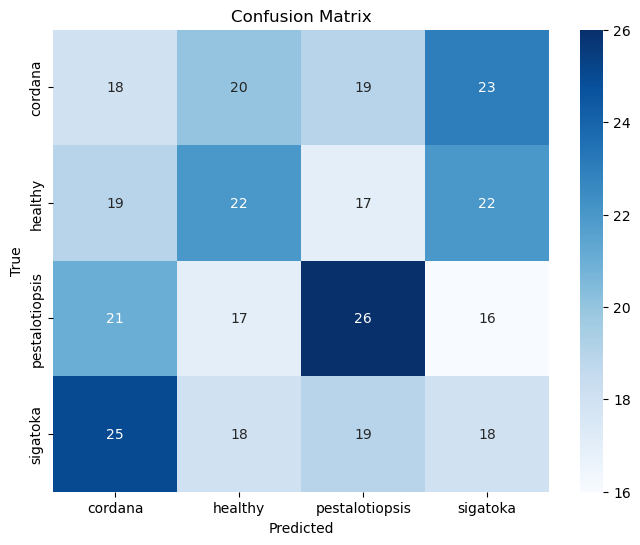

Classification Report:
                precision    recall  f1-score   support

       cordana       0.22      0.23      0.22        80
       healthy       0.29      0.28      0.28        80
pestalotiopsis       0.32      0.33      0.32        80
      sigatoka       0.23      0.23      0.23        80

      accuracy                           0.26       320
     macro avg       0.26      0.26      0.26       320
  weighted avg       0.26      0.26      0.26       320



In [49]:
evaluate_model(model_densenet201, val_generator)

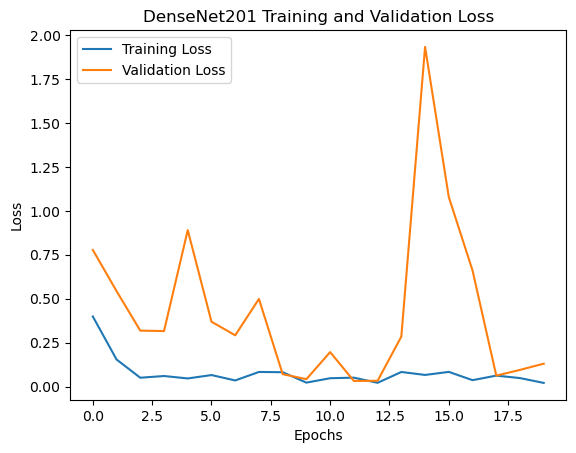

In [110]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.plot(history_finetune_densenet201.history['loss'], label='Training Loss')
plt.plot(history_finetune_densenet201.history['val_loss'], label='Validation Loss')
plt.title('DenseNet201 Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


Inception VNet

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 33s 0us/step
Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.4618 - loss: 1.6225 - val_accuracy: 0.6250 - val_loss: 1.2796
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 50s 1s/step - accuracy: 0.7932 - loss: 0.5480 - val_accuracy: 0.8250 - val_loss: 0.5698
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 50s 1s/step - accuracy: 0.8615 - loss: 0.4030 - val_accuracy: 0.8625 - val_loss: 0.4658
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 52s 1s/step - accuracy: 0.9101 - loss: 0.3031 - val_accuracy: 0.8687 - val_loss: 0.4820
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.9177 - loss: 0.2453 - val_accuracy: 0.8594 - val_loss: 0.4618
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - accuracy: 0.9321 - loss: 0.2088 - val_accuracy: 0.8781 - val_loss: 0.4057
Epoch 7/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - accuracy: 0.9502 - loss: 0.1632 - val_accuracy: 0.8875 - val_loss: 0.3709
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - accuracy: 0.94

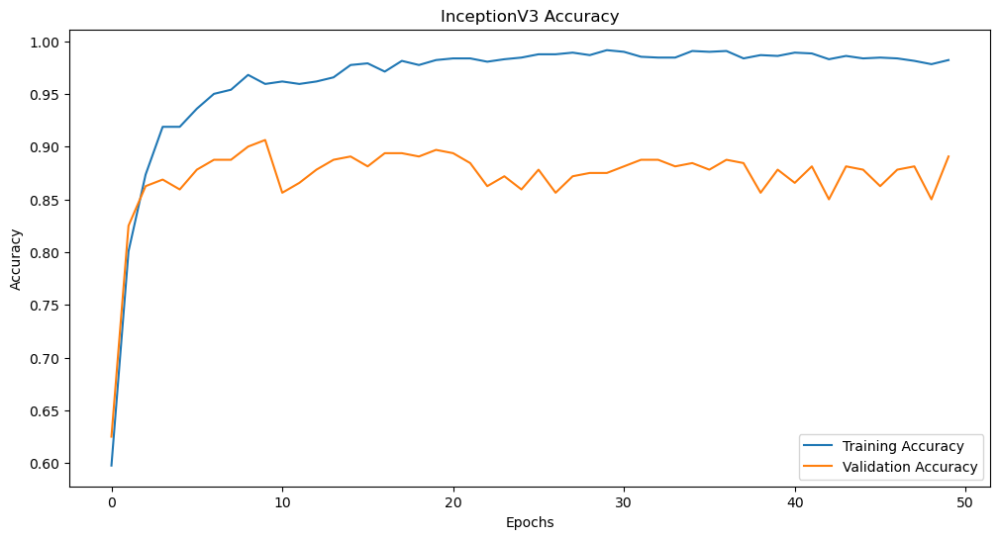

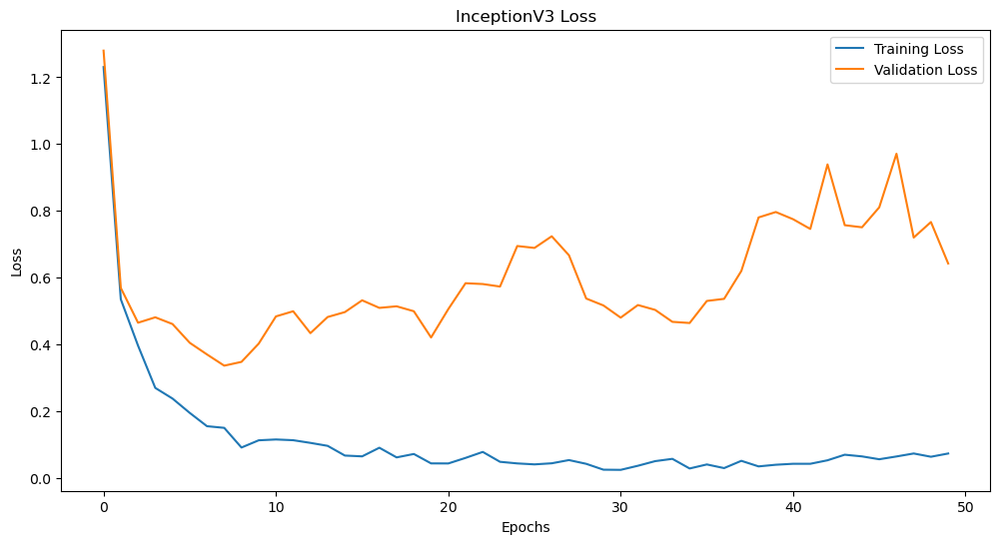

In [59]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Load the pretrained InceptionV3 model without the top (output) layer
base_model_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze the base model layers
base_model_inception.trainable = False

# Add custom layers
model_inception = Sequential([
    base_model_inception,
    GlobalAveragePooling2D(),
    BatchNormalization(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(4, activation='softmax')  # Output for 4 classes
])

# Compile the model
model_inception.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history_inception = model_inception.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(history_inception.history['accuracy'], label='Training Accuracy')
plt.plot(history_inception.history['val_accuracy'], label='Validation Accuracy')
plt.title('InceptionV3 Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(history_inception.history['loss'], label='Training Loss')
plt.plot(history_inception.history['val_loss'], label='Validation Loss')
plt.title('InceptionV3 Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


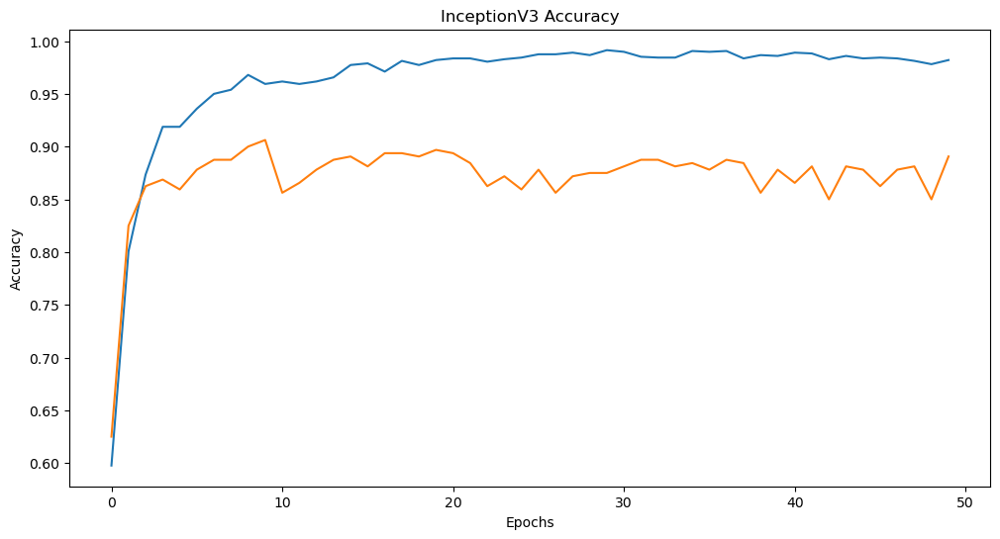

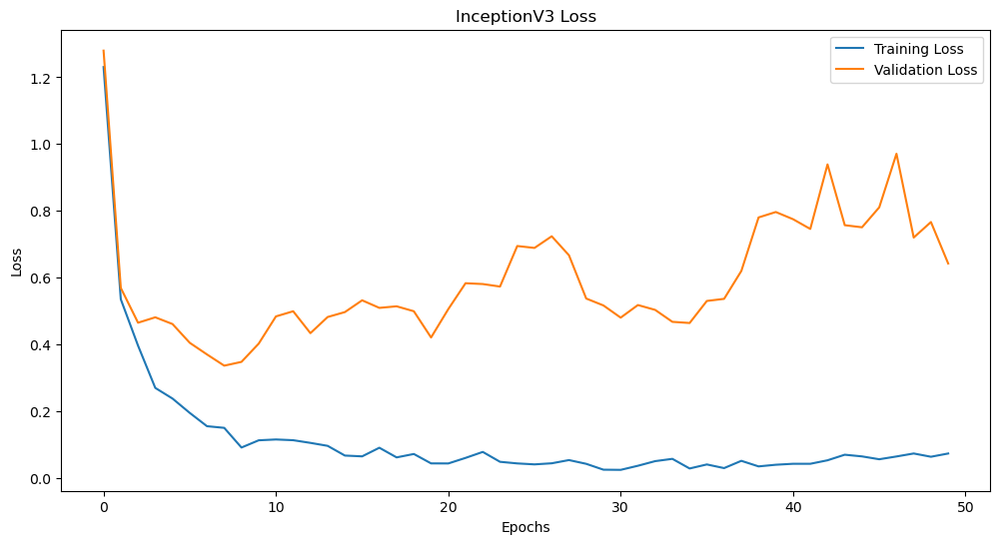

In [62]:
# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(history_inception.history['accuracy'], label='Training Accuracy')
plt.plot(history_inception.history['val_accuracy'], label='Validation Accuracy')
plt.title('InceptionV3 Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(history_inception.history['loss'], label='Training Loss')
plt.plot(history_inception.history['val_loss'], label='Validation Loss')
plt.title('InceptionV3 Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

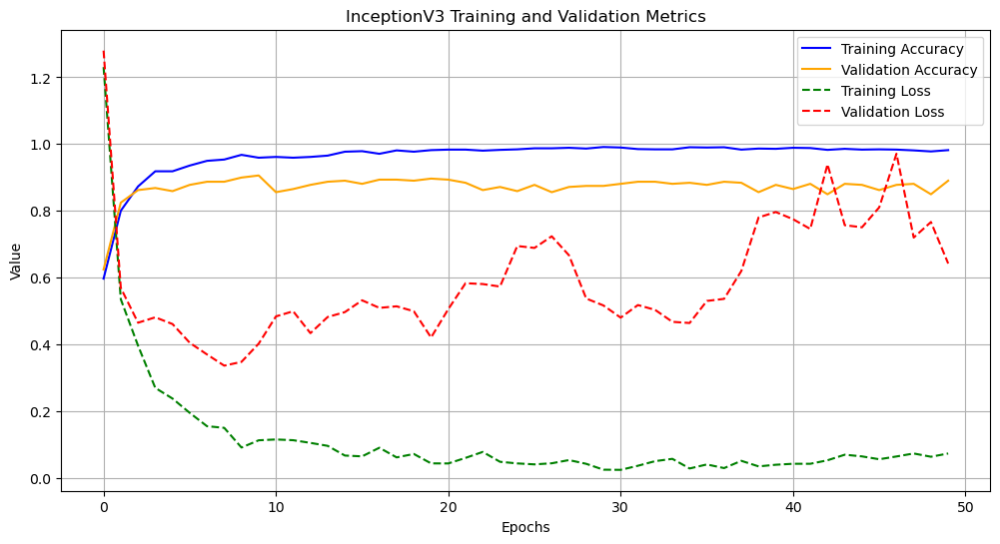

In [112]:
# Plot training and validation accuracy and loss in one chart
plt.figure(figsize=(12, 6))
plt.plot(history_inception.history['accuracy'], label='Training Accuracy', color='blue')
plt.plot(history_inception.history['val_accuracy'], label='Validation Accuracy', color='orange')
plt.plot(history_inception.history['loss'], label='Training Loss', color='green', linestyle='--')
plt.plot(history_inception.history['val_loss'], label='Validation Loss', color='red', linestyle='--')
plt.title('InceptionV3 Training and Validation Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()


In [130]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def evaluate_model(model, generator, cmap='coolwarm'):
    # Get true labels and predictions
    y_true = generator.classes
    y_pred = model.predict(generator)
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred_classes)
    class_names = list(generator.class_indices.keys())

    # Plot Confusion Matrix with Custom Colors
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()


10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 452ms/step


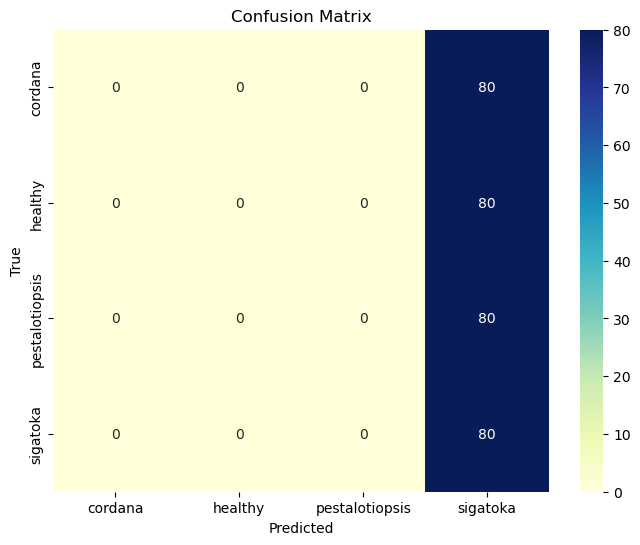

In [118]:
evaluate_model(model_efficientnet, val_generator)

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 368ms/step


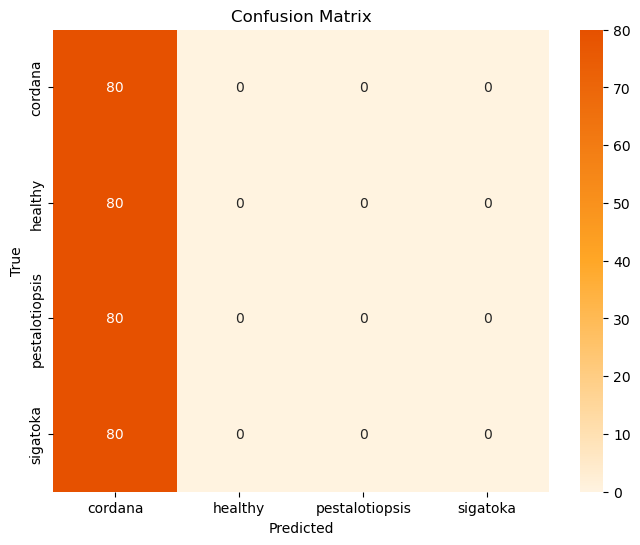

Classification Report:
                precision    recall  f1-score   support

       cordana       0.25      1.00      0.40        80
       healthy       0.00      0.00      0.00        80
pestalotiopsis       0.00      0.00      0.00        80
      sigatoka       0.00      0.00      0.00        80

      accuracy                           0.25       320
     macro avg       0.06      0.25      0.10       320
  weighted avg       0.06      0.25      0.10       320



In [128]:
evaluate_model(model_squeezenet, val_generator)

In [124]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

def evaluate_model(model, generator, cmap=None):  
    # Define a light orange colormap if none is provided
    if cmap is None:
        cmap = LinearSegmentedColormap.from_list("light_orange", ["#FFF3E0", "#FFA726", "#E65100"])

    # Get true labels and predictions
    y_true = generator.classes
    y_pred = model.predict(generator)
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred_classes)
    class_names = list(generator.class_indices.keys())

    # Plot Confusion Matrix with Light Orange Colors
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=class_names, yticklabels=class_names, cbar=True)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    # Classification Report
    print("Classification Report:")
    print(classification_report(y_true, y_pred_classes, target_names=class_names))


10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 396ms/step


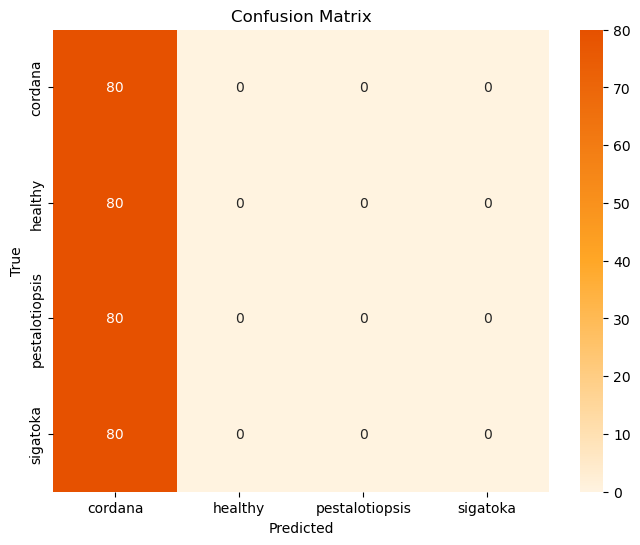

Classification Report:
                precision    recall  f1-score   support

       cordana       0.25      1.00      0.40        80
       healthy       0.00      0.00      0.00        80
pestalotiopsis       0.00      0.00      0.00        80
      sigatoka       0.00      0.00      0.00        80

      accuracy                           0.25       320
     macro avg       0.06      0.25      0.10       320
  weighted avg       0.06      0.25      0.10       320



In [126]:
evaluate_model(model_squeezenet, val_generator)

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 493ms/step


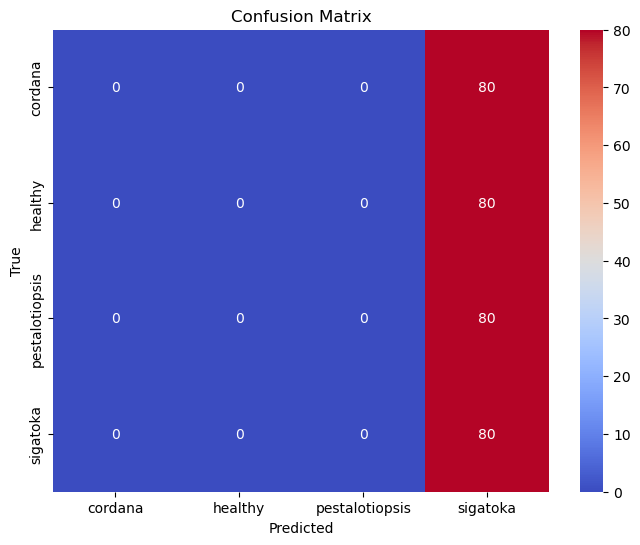

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 618ms/step


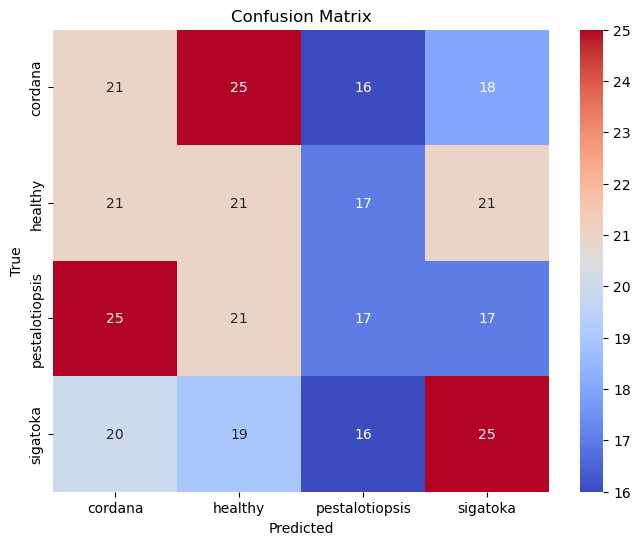

In [139]:
evaluate_model(model_inception, val_generator)

In [153]:
def build_model(model_type):
    base_model = None  # Initialize base_model

    if model_type == "EfficientNet":
        base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
    elif model_type == "ResNet50":
        base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
    elif model_type == "ResNet101":
        base_model = ResNet101(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
    elif model_type == "MobileNetV3":
        base_model = MobileNetV3Small(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
    elif model_type == "InceptionV3":
        base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
    elif model_type == "SqueezeNet":
        # Use ResNet50 as a placeholder for Improved SqueezeNet
        print("Using ResNet50 as a placeholder for Improved SqueezeNet.")
        base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
    else:
        raise ValueError(f"Invalid model_type '{model_type}'. Please choose a valid model.")

    # Freeze the base model
    base_model.trainable = False

    # Add additional layers
    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        BatchNormalization(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(4, activation='softmax')  # Adjust number of classes
    ])
    return model


In [155]:
convergence_results = {model_name: {opt_name: [] for opt_name in optimizers.keys()} 
                       for model_name in ["EfficientNet", "ResNet50", "ResNet101", "MobileNetV3", "InceptionV3", "SqueezeNet"]}

# Loop through each model and optimizer
for model_name in convergence_results.keys():
    for opt_name, optimizer in optimizers.items():
        print(f"Training {model_name} with {opt_name} optimizer...")
        
        # Build the model
        model = build_model(model_name)
        model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
        
        # Early stopping
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
        
        # Train the model
        history = model.fit(
            train_generator,
            validation_data=val_generator,
            epochs=15,
            batch_size=32,
            callbacks=[early_stopping],
            verbose=0  # Suppress training output
        )
        
        # Save min loss values for convergence analysis
        convergence_results[model_name][opt_name] = history.history['val_loss']

# Plot convergence analysis for each model
for model_name, optimizers_losses in convergence_results.items():
    plt.figure(figsize=(12, 8))
    for opt_name, losses in optimizers_losses.items():
        plt.plot(range(1, len(losses) + 1), losses, label=f"{opt_name}")
    plt.title(f"Convergence Analysis ({model_name})")
    plt.xlabel("Number of Calls (Epochs)")
    plt.ylabel("Min Loss (Log Scale)")
    plt.yscale('log')
    plt.xticks(range(0, 20, 5))
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    plt.show()

Training EfficientNet with Adadelta optimizer...
Training EfficientNet with Adam optimizer...
Training EfficientNet with RMSprop optimizer...
Training EfficientNet with SGD optimizer...
Training ResNet50 with Adadelta optimizer...


ValueError: Unknown variable: <KerasVariable shape=(2048,), dtype=float32, path=sequential_11/batch_normalization_105/gamma>. This optimizer can only be called for the variables it was originally built with. When working with a new set of variables, you should recreate a new optimizer instance.

Training EfficientNet with Adam optimizer...
Epoch 1/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 65s 951ms/step - accuracy: 0.2286 - loss: 1.9613 - val_accuracy: 0.2500 - val_loss: 1.4092
Epoch 2/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 32s 797ms/step - accuracy: 0.2618 - loss: 1.6717 - val_accuracy: 0.2500 - val_loss: 1.3896
Epoch 3/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 39s 742ms/step - accuracy: 0.2392 - loss: 1.6006 - val_accuracy: 0.2500 - val_loss: 1.3873
Epoch 4/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 29s 726ms/step - accuracy: 0.2680 - loss: 1.5365 - val_accuracy: 0.2500 - val_loss: 1.3865
Epoch 5/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 740ms/step - accuracy: 0.2578 - loss: 1.4694 - val_accuracy: 0.2500 - val_loss: 1.3863
Epoch 6/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 29s 717ms/step - accuracy: 0.2398 - loss: 1.4565 - val_accuracy: 0.2688 - val_loss: 1.3863
Epoch 7/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 29s 724ms/step - accuracy: 0.2458 - loss: 1.4365 - val_accuracy: 0.3094 - val_loss: 1.3862
Epoch 8/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 740ms/step

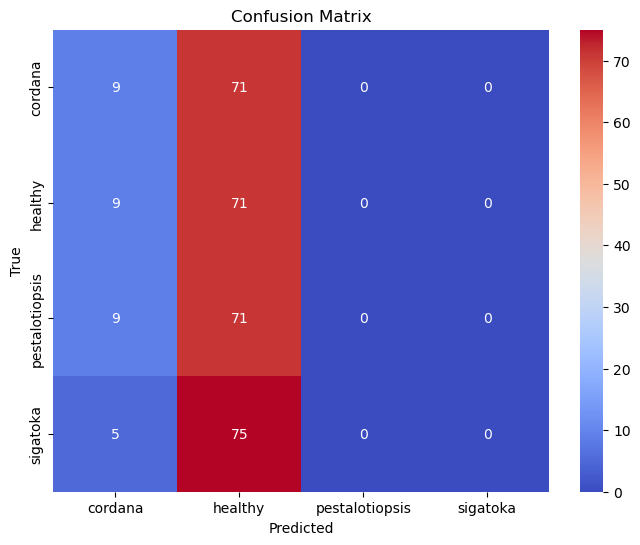

Training EfficientNet with Adadelta optimizer...
Epoch 1/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 67s 889ms/step - accuracy: 0.2406 - loss: 1.8229 - val_accuracy: 0.2500 - val_loss: 1.3911
Epoch 2/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 740ms/step - accuracy: 0.2741 - loss: 1.7052 - val_accuracy: 0.2500 - val_loss: 1.3921
Epoch 3/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 742ms/step - accuracy: 0.2552 - loss: 1.5875 - val_accuracy: 0.2906 - val_loss: 1.3871
Epoch 4/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 752ms/step - accuracy: 0.2512 - loss: 1.5632 - val_accuracy: 0.2500 - val_loss: 1.3864
Epoch 5/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 31s 768ms/step - accuracy: 0.2499 - loss: 1.5119 - val_accuracy: 0.2500 - val_loss: 1.3862
Epoch 6/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 738ms/step - accuracy: 0.2612 - loss: 1.4667 - val_accuracy: 0.2500 - val_loss: 1.3862
Epoch 7/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 759ms/step - accuracy: 0.2628 - loss: 1.4583 - val_accuracy: 0.2500 - val_loss: 1.3862
Epoch 8/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 742ms/

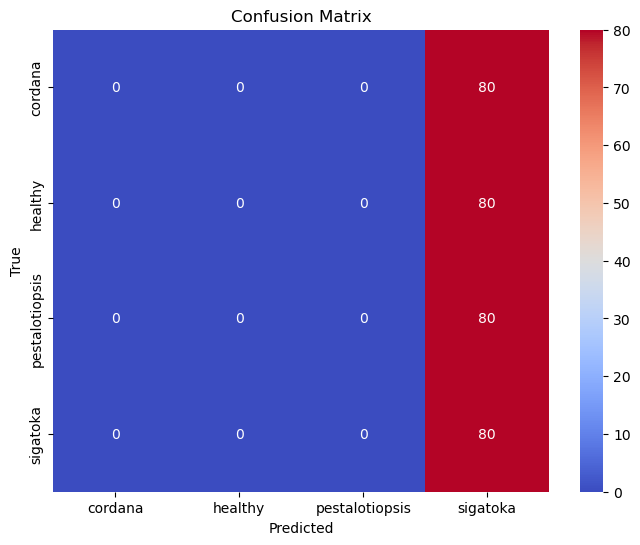

Training EfficientNet with RMSprop optimizer...
Epoch 1/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 63s 919ms/step - accuracy: 0.2419 - loss: 1.9600 - val_accuracy: 0.2500 - val_loss: 1.3873
Epoch 2/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 736ms/step - accuracy: 0.2218 - loss: 1.6537 - val_accuracy: 0.2500 - val_loss: 1.3867
Epoch 3/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 746ms/step - accuracy: 0.2628 - loss: 1.6286 - val_accuracy: 0.2500 - val_loss: 1.3868
Epoch 4/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 741ms/step - accuracy: 0.2693 - loss: 1.5451 - val_accuracy: 0.2500 - val_loss: 1.3863
Epoch 5/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 40s 723ms/step - accuracy: 0.2285 - loss: 1.5491 - val_accuracy: 0.2500 - val_loss: 1.3866
Epoch 6/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 760ms/step - accuracy: 0.2305 - loss: 1.4916 - val_accuracy: 0.2500 - val_loss: 1.3863
Epoch 7/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 39s 719ms/step - accuracy: 0.2294 - loss: 1.5305 - val_accuracy: 0.2500 - val_loss: 1.3864
Epoch 8/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 28s 713ms/s

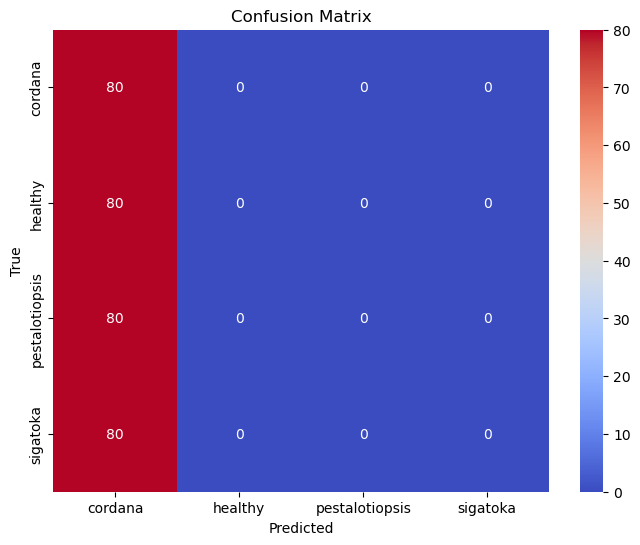

Training EfficientNet with SGD optimizer...
Epoch 1/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 63s 879ms/step - accuracy: 0.2564 - loss: 1.6275 - val_accuracy: 0.2500 - val_loss: 1.3903
Epoch 2/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 755ms/step - accuracy: 0.2472 - loss: 1.5785 - val_accuracy: 0.2500 - val_loss: 1.3883
Epoch 3/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 743ms/step - accuracy: 0.2534 - loss: 1.5810 - val_accuracy: 0.2500 - val_loss: 1.3873
Epoch 4/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 741ms/step - accuracy: 0.2295 - loss: 1.6427 - val_accuracy: 0.2500 - val_loss: 1.3867
Epoch 5/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 31s 782ms/step - accuracy: 0.2622 - loss: 1.5453 - val_accuracy: 0.2906 - val_loss: 1.3865
Epoch 6/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 29s 721ms/step - accuracy: 0.2495 - loss: 1.5874 - val_accuracy: 0.3187 - val_loss: 1.3864
Epoch 7/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 755ms/step - accuracy: 0.2335 - loss: 1.5725 - val_accuracy: 0.3438 - val_loss: 1.3864
Epoch 8/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 738ms/step 

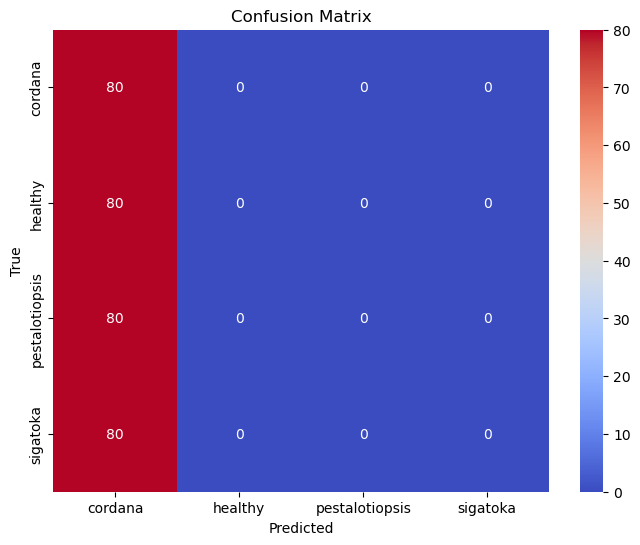

Training ResNet50 with Adam optimizer...
Epoch 1/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 106s 2s/step - accuracy: 0.3886 - loss: 1.2869 - val_accuracy: 0.2500 - val_loss: 1.8666
Epoch 2/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.5673 - loss: 1.0030 - val_accuracy: 0.2500 - val_loss: 1.9546
Epoch 3/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 86s 2s/step - accuracy: 0.6640 - loss: 0.8623 - val_accuracy: 0.2500 - val_loss: 1.9364
Epoch 4/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.6776 - loss: 0.8351 - val_accuracy: 0.2500 - val_loss: 1.7939
Epoch 5/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - accuracy: 0.6971 - loss: 0.7693 - val_accuracy: 0.3875 - val_loss: 1.8883
Epoch 6/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.7140 - loss: 0.7128 - val_accuracy: 0.3000 - val_loss: 2.0226
Epoch 7/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.7410 - loss: 0.6496 - val_accuracy: 0.3469 - val_loss: 1.7081
Epoch 8/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.7406 - loss:

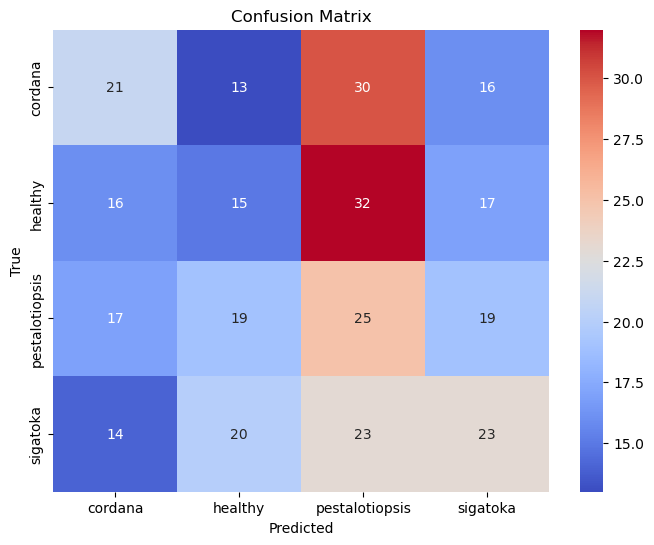

Training ResNet50 with Adadelta optimizer...
Epoch 1/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 109s 2s/step - accuracy: 0.4166 - loss: 1.2570 - val_accuracy: 0.2500 - val_loss: 2.0757
Epoch 2/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - accuracy: 0.5557 - loss: 1.0373 - val_accuracy: 0.2500 - val_loss: 2.5165
Epoch 3/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.6589 - loss: 0.9059 - val_accuracy: 0.2500 - val_loss: 2.2518
Epoch 4/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.6644 - loss: 0.8129 - val_accuracy: 0.2500 - val_loss: 2.1469
Epoch 5/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step - accuracy: 0.6752 - loss: 0.7930 - val_accuracy: 0.3906 - val_loss: 2.1851
Epoch 6/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.7334 - loss: 0.6929 - val_accuracy: 0.3875 - val_loss: 1.8394
Epoch 7/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - accuracy: 0.7483 - loss: 0.6716 - val_accuracy: 0.4125 - val_loss: 1.8508
Epoch 8/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 78s 2s/step - accuracy: 0.7402 - l

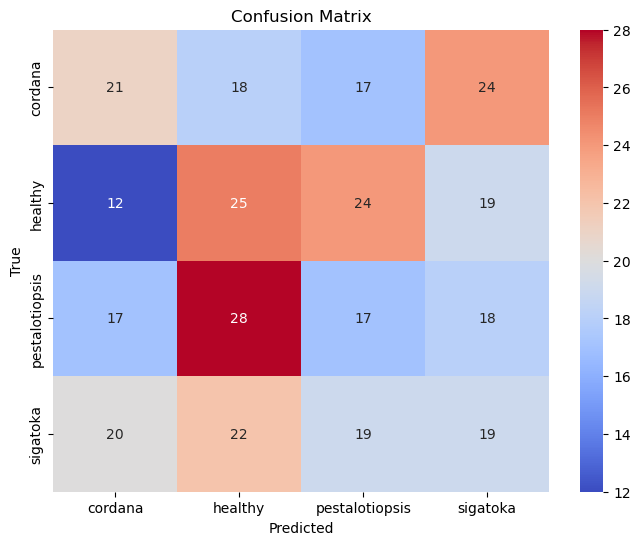

Training ResNet50 with RMSprop optimizer...
Epoch 1/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - accuracy: 0.4156 - loss: 1.2433 - val_accuracy: 0.2500 - val_loss: 1.9343
Epoch 2/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.6076 - loss: 0.9796 - val_accuracy: 0.2500 - val_loss: 2.1725
Epoch 3/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.6276 - loss: 0.9258 - val_accuracy: 0.2500 - val_loss: 2.2384
Epoch 4/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step - accuracy: 0.6695 - loss: 0.8332 - val_accuracy: 0.4625 - val_loss: 1.9364
Epoch 5/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step - accuracy: 0.7057 - loss: 0.7766 - val_accuracy: 0.4812 - val_loss: 1.8138
Epoch 6/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.7176 - loss: 0.6943 - val_accuracy: 0.3281 - val_loss: 1.7809
Epoch 7/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step - accuracy: 0.7593 - loss: 0.6646 - val_accuracy: 0.4250 - val_loss: 1.4689
Epoch 8/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step - accuracy: 0.7778 - los

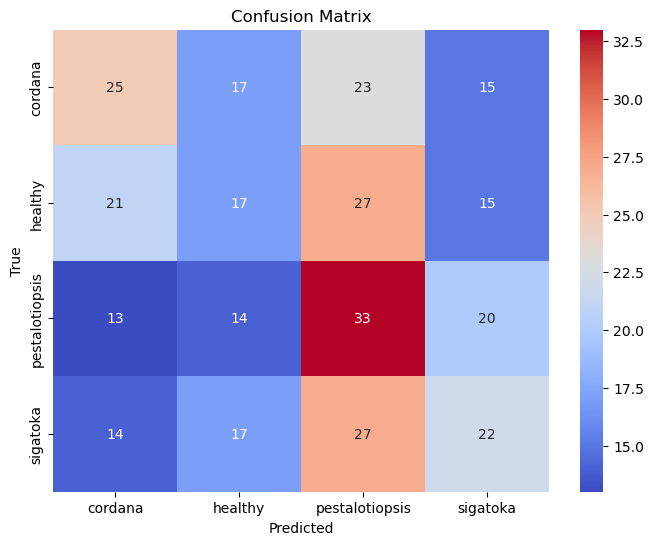

Training ResNet50 with SGD optimizer...
Epoch 1/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - accuracy: 0.2357 - loss: 1.4022 - val_accuracy: 0.2500 - val_loss: 1.5283
Epoch 2/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - accuracy: 0.2517 - loss: 1.3880 - val_accuracy: 0.2500 - val_loss: 1.4847
Epoch 3/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.2851 - loss: 1.3795 - val_accuracy: 0.2500 - val_loss: 1.4506
Epoch 4/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.2629 - loss: 1.3649 - val_accuracy: 0.2500 - val_loss: 1.4242
Epoch 5/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.3156 - loss: 1.3612 - val_accuracy: 0.2500 - val_loss: 1.4042
Epoch 6/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.3172 - loss: 1.3572 - val_accuracy: 0.2500 - val_loss: 1.3890
Epoch 7/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.3142 - loss: 1.3475 - val_accuracy: 0.2500 - val_loss: 1.3758
Epoch 8/15
40/40 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.3499 - loss: 1

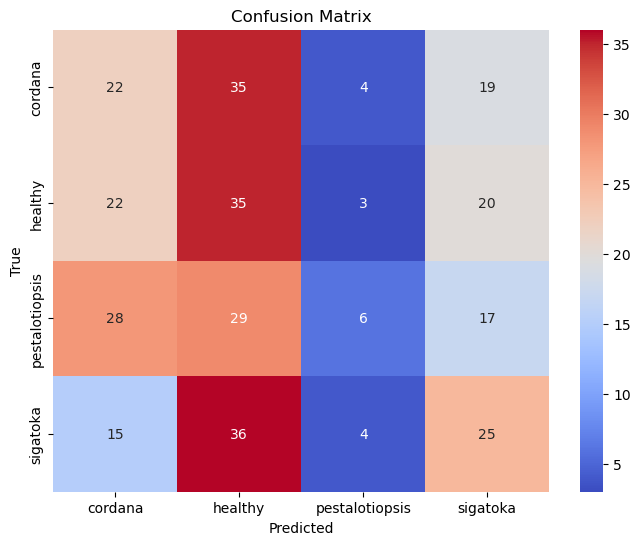

Training ResNet101 with Adam optimizer...
Epoch 1/15
20/40 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.3629 - loss: 1.3550

In [ ]:
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop, SGD

# Define optimizer options
optimizers = {
    "Adam": lambda: Adam(learning_rate=1e-3),
    "Adadelta": lambda: Adadelta(learning_rate=1.0),
    "RMSprop": lambda: RMSprop(learning_rate=1e-3),
    "SGD": lambda: SGD(learning_rate=1e-3)
}

# Loop through models and optimizers
for model_name in ["EfficientNet", "ResNet50", "ResNet101", "MobileNetV3", "InceptionV3", "SqueezeNet"]:
    for opt_name, opt_func in optimizers.items():
        print(f"Training {model_name} with {opt_name} optimizer...")

        # Build the model
        model = build_model(model_name)

        # Create a new optimizer instance
        optimizer = opt_func()

        # Compile the model
        model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

        # Early stopping
        early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

        # Train the model
        history = model.fit(
            train_generator,
            validation_data=val_generator,
            epochs=15,
            batch_size=32,
            callbacks=[early_stopping]
        )

        # Evaluate and save results
        print(f"Finished training {model_name} with {opt_name}.")
        evaluate_model(model, val_generator)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop, SGD
from sklearn.model_selection import ParameterGrid

# Define the optimizers and learning rates to test
optimizers = {
    "Adam": Adam,
    "Adadelta": Adadelta,
    "RMSprop": RMSprop,
    "SGD": SGD
}
learning_rates = [1e-3, 1e-4, 1e-5, 1e-2, 1e-1]  # Learning rate values to test

# Function to train and evaluate the model
def train_evaluate_model(optimizer_name, learning_rate):
    # Build and compile model with the given optimizer and learning rate
    optimizer = optimizers[optimizer_name](learning_rate=learning_rate)
    
    # Build the model (make sure to define the model architecture here)
    model = build_model('EfficientNet')  # Replace with the model you want to use
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    
    # Train the model
    history = model.fit(train_generator, validation_data=val_generator, epochs=5, batch_size=32)
    
    # Return the validation accuracy (or other metric of interest)
    return history.history['val_accuracy'][-1]

# Create a grid of hyperparameters
grid = ParameterGrid({'optimizer': optimizers.keys(), 'learning_rate': learning_rates})

# Initialize a matrix to hold the performance metrics
performance_matrix = np.zeros((len(optimizers), len(learning_rates)))

# Train the models and record the performance
for i, (optimizer_name, learning_rate) in enumerate(grid):
    val_accuracy = train_evaluate_model(optimizer_name, learning_rate)
    optimizer_idx = list(optimizers.keys()).index(optimizer_name)
    lr_idx = learning_rates.index(learning_rate)
    performance_matrix[optimizer_idx, lr_idx] = val_accuracy

# Plotting the heatmap
plt.figure(figsize=(10, 6))
plt.imshow(performance_matrix, interpolation='nearest', cmap='YlGnBu', aspect='auto')
plt.colorbar(label='Validation Accuracy')

# Set axis labels
plt.xticks(np.arange(len(learning_rates)), learning_rates, rotation=45)
plt.yticks(np.arange(len(optimizers)), list(optimizers.keys()))

plt.xlabel('Learning Rate')
plt.ylabel('Optimizer')
plt.title('PDP with Optimizer and Learning Rate')

# Plot the star (best performance) location
best_idx = np.unravel_index(np.argmax(performance_matrix), performance_matrix.shape)
plt.scatter(best_idx[1], best_idx[0], color='red', s=100, marker='*', label='Best')

plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
print("The End")